
### Com os embeddings criados, o próximo desafio é mapear e identificar onde, dentro dessas representações, cada pilar-chave está localizado — como cor, estampa e modelagem.

A ideia é analisar como essas características se manifestam no espaço vetorial dos embeddings. Precisamos descobrir em quais subespaços específicos cada atributo se concentra, de forma que, por exemplo, cores semelhantes tenham vetores próximos dentro do subespaço dedicado à cor. Esse mapeamento permitirá uma separação clara entre os diferentes pilares e facilitará a análise de similaridade e comparação de produtos com base em atributos específicos.

# PILAR DE COR

Vamos começar com foco em identificar o subespaço de cor das roupas.

### Ideias

**Ideia 1: Inclusão de Blocos de Cores Sólidas e PCA**\
Uma abordagem inicial consiste em gerar embeddings a partir de blocos de cores sólidas e descrições genéricas centradas na cor (por exemplo, "roupa de cor amarela"), em conjunto com os embeddings dos produtos. A hipótese é que, ao incluir essas informações no conjunto de dados, poderemos identificar o subespaço relacionado às cores por meio da Análise de Componentes Principais (PCA), verificando se existe um agrupamento claro que capture a variação cromática.

Possíveis testes:

- Gerar embeddings de imagens com cores puras.
- Gerar embeddings de descrições de cores.
- Gerar embeddings com imagens de uma mesma roupa de diferentes cores.

*Comentário: Esta abordagem é interessante pois explora a capacidade do modelo de associar variações puras de cor, aproveitando
a PCA para redução de dimensionalidade e exploração da variância nas dimensões cromáticas.
O desafio será garantir que a cor seja capturada de forma independente de outras características visuais,
como textura ou estampa.*


**Ideia 2: Utilização de PLS-DA com a Cor como Variável Alvo**\
Uma alternativa é utilizar Partial Least Squares (PLS), especificamente o PLS-DA (uma extensão do PLS tradicional adaptada para problemas de classificação, onde a variável dependente é categórica). Nessa abordagem, o objetivo é definir a cor como variável alvo e ajustar os embeddings de modo que as direções no espaço vetorial maximizem a correlação com os valores de cor.

*Comentário: É necessário ter uma variável alvo de cor para cada produto.*


**Alternativa: retreinar o modelo inserindo imagens estratégicas**\
Caso os resultados não sejam positivos, há ainda a possibilidade de fazer um fine-tunnig no CLIP incluindo imagens que ajudem a identificar clusters posteriormente, como cores sólidas.

### Adiantando possíveis impasses:
Precisamos garantir que o subespaço de cor não esteja considerando a cor do fundo e da modelo.

Qual abordagem é mais promissora inicialmente?

1. Primeiro nos preocupamos em testar diferentes técnicas para verificar se o modelo é capaz de identificar a cor independentemente disso.
2. Garantimos inicialmente que estamos olhando apenas para a roupa (excluir modelo e fundo) para só aí tentar identificar o subespaço da cor.(Possível impasse: será que isso piora a capacidade do modelo de reconhecer as roupas já que não tem a modelo como perspectiva e os recortes podem ficar não suaves?)

Uma possível solução seguindo a 2° abordagem seria recortar apenas a roupa e excluir modelo e fundo.

Encontrei uma maneira razoável de fazer isso em <https://colab.research.google.com/drive/1N-Uiq5OqJHxUsVFUcSmbOq0Om9VkK4bH#scrollTo=zeAIoYydgkVk>

Entretanto, apenas com alguns testes já foi possível notar que o modelo pode se perder por conta do recorte. Como o recorte não é suave, acaba interfirindo na cor principal da roupa. Talvez um caminho mais correto seria identificar nos embeddings o subespaço que corresponde a modelo e ao fundo.


*Vamos seguir explorando técnicas com as imagens inteiras e tentar identificar as cores das roupas independentemente.*

## 1° abordagem: PCA

In [249]:
from sentence_transformers import SentenceTransformer, util
from PIL import Image, ImageFile
import requests
import torch

# We use the original clip-ViT-B-32 for encoding images
img_model = SentenceTransformer('clip-ViT-B-32')

# Our text embedding model is aligned to the img_model and maps 50+
# languages to the same vector space
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\_utils.py:776: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\tokenization_utils_base.py:1617: FutureWarning:

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884



In [250]:
# Função para plotar a imagem a partir do caminho
from matplotlib import pyplot as plt
from PIL import Image

def plot_image(image_path):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

### Descrições personalizadas

In [251]:
import pandas as pd

# Importanto embeddings das imagens
df_img_embs = pd.read_parquet('datasets/img_embeddings.parquet')

In [252]:
df_img_embs.sample(3)

,id,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
28,330139_07412,0.018977,-0.320352,-0.089446,0.348890,-0.407422,-0.139129,-0.041036,0.157353,0.535874,...,0.058303,-0.135674,0.751630,-0.245629,-0.265341,0.228649,-0.032114,0.280598,0.089820,0.642998
55,332928_48288,0.073988,-0.308742,0.004666,0.358943,-0.144102,0.117613,-0.332573,0.248886,0.310693,...,0.398613,-0.178118,0.565271,0.123494,-0.286058,0.067710,0.234718,0.189889,-0.018557,0.555804
19,329757_05052,-0.051953,-0.346765,0.016094,0.304819,-0.253690,-0.353932,-0.071928,0.123548,0.315263,...,0.550880,-0.103710,0.460097,-0.127718,-0.127878,0.080599,0.128233,0.318907,-0.045743,0.276284


In [253]:
df_img_embs.shape

(64, 513)

In [254]:
# Criando lista de descrições puras para cada cor
description_list_pt = [
    'Roupa da cor preta',
    'Roupa da cor branca',
    'Roupa da cor vermelha',
    'Roupa da cor amarela',
    'Roupa da cor verde',
    'Roupa da cor azul',
    'Roupa da cor roxa',
    'Roupa da cor marrom',
    'Roupa da cor rosa',
    'Roupa da cor laranja'
]

description_list = [
    'Black color clothing',
    'White color clothing',
    'Red color clothing',
    'Yellow color clothing',
    'Green color clothing',
    'Blue color clothing',
    'Purple color clothing',
    'Brown color clothing',
    'Pink color clothing',
    'Orange color clothing'
]


cores_embeddings = text_model.encode(description_list)

In [255]:
df_img_embs.head(1)

,id,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
0,313278_02851,0.270649,-0.068943,-0.142831,0.160612,-0.448108,0.355952,-0.259336,0.197335,0.52908,...,-0.134417,-0.11291,0.619426,-0.226216,-0.368055,0.21295,0.231464,0.116424,-0.064459,0.813807


In [256]:
# Usar PCA nos embs das cores
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
cores_embeddings_pca.shape

(10, 2)

In [257]:
df = pd.read_parquet('datasets/base.parquet')

In [258]:
df.sample(5)

,image_path,file_name,id,desc_produto
42,clothes_images/330169_07413_2-CALCA-RETA-COS-L...,330169_07413_2-CALCA-RETA-COS-LARGO,330169_07413,Calca reta cos largo
7,clothes_images/325496_46188_1-VESTIDO-CROCHET-...,325496_46188_1-VESTIDO-CROCHET-ESTAMPADO-COBRA...,325496_46188,Vestido crochet estampado cobra yawanawa
38,clothes_images/330157_07414_2-VESTIDO-CURTO-MA...,330157_07414_2-VESTIDO-CURTO-MANGAS-BUFANTES,330157_07414,Vestido curto mangas bufantes
21,clothes_images/330027_05079_2-MACACAO-PLISSADO...,330027_05079_2-MACACAO-PLISSADO,330027_05079,Macacao plissado
58,clothes_images/333122_48978_2-CALCA-TAMBAQUI-D...,333122_48978_2-CALCA-TAMBAQUI-DECORADO,333122_48978,Calca tambaqui decorado


In [259]:
# Pegando colunas no formato emb_img_
img_cols = [col for col in df_img_embs.columns if 'emb_img_' in col]
img_embs = df_img_embs[img_cols].values

#### Top 3 cores para cada imagem

clothes_images/313278_02851_2-BLUSA-GOLA-MANGAS.jpg


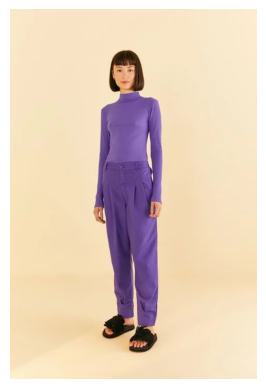

Purple color clothing 0.94
Pink color clothing 0.70
Blue color clothing 0.47

clothes_images/317431_0700_2-CROPPED-MANGA-LONGA-ADIDAS-ESTAMPADO-SUNNY-DAY-VIVID-RED.jpg


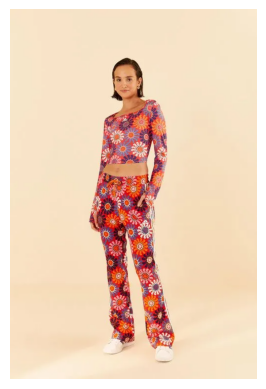

Pink color clothing 0.99
Purple color clothing 0.85
Red color clothing 0.80

clothes_images/323253_0013_1-CALCA-BICOLOR-ALFAIATARIA.jpg


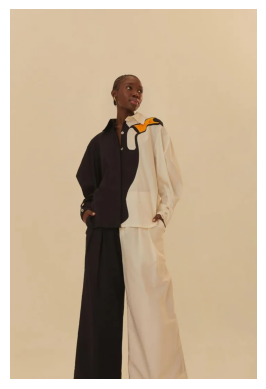

Green color clothing 1.00
White color clothing 0.96
Black color clothing 0.85

clothes_images/323253_07032_1-CALCA-BICOLOR-ALFAIATARIA.jpg


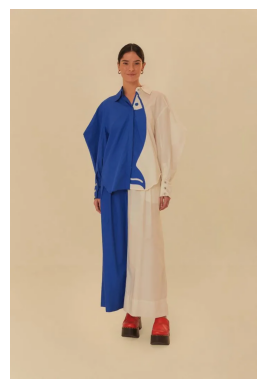

Blue color clothing 1.00
Black color clothing 0.98
White color clothing 0.89

clothes_images/324277_0012_1-CALCA-SARJA-CARGO-COM-CINTO.jpg


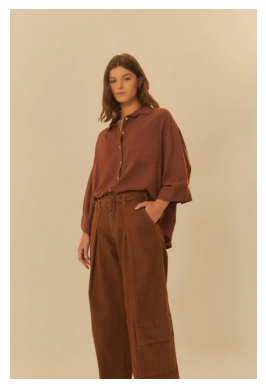

Yellow color clothing 0.96
Brown color clothing 0.93
Orange color clothing 0.63

clothes_images/324786_0105_2-CALCA-JEANS-AMPLA-PREGAS-BAIXA.jpg


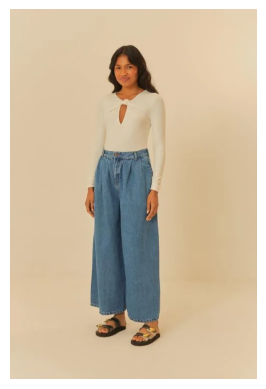

Black color clothing 0.99
Blue color clothing 0.99
White color clothing 0.93

clothes_images/325155_0700_2-CAMISA-ADIDAS-SOLAR-KALEIDOSCOPE-ROSA.jpg


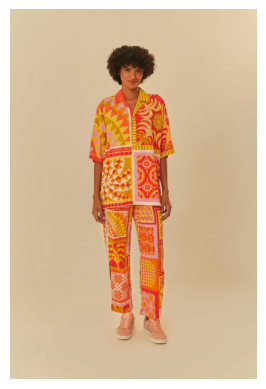

Orange color clothing 0.99
Red color clothing 0.77
Yellow color clothing 0.73

clothes_images/325496_46188_1-VESTIDO-CROCHET-ESTAMPADO-COBRA-YAWANAWA.jpg


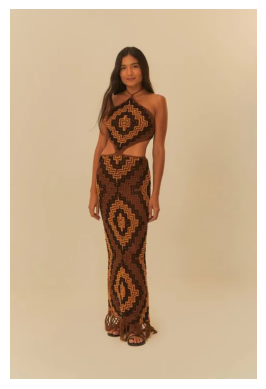

Brown color clothing 0.94
Green color clothing 0.94
White color clothing 0.80

clothes_images/325755_46189_2-CALCA-ESTAMPADA-COBRA-MAXI.jpg


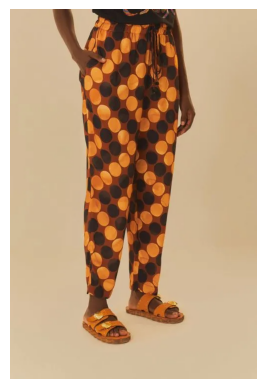

Yellow color clothing 0.99
Orange color clothing 0.90
Brown color clothing 0.68

clothes_images/327287_48291_1-VESTIDO-ESTAMPADO-AURORA-FLORAL.jpg


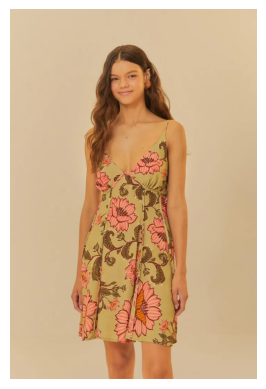

Orange color clothing 1.00
Yellow color clothing 0.79
Red color clothing 0.71

clothes_images/327917_0013_1-VESTIDO-BORDADO-AMAZONIA.jpg


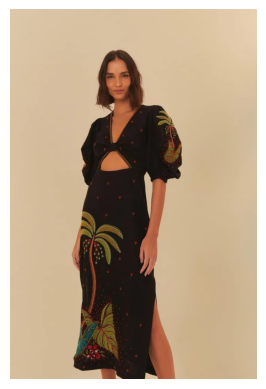

White color clothing 0.99
Green color clothing 0.98
Black color clothing 0.93

clothes_images/327931_07058_1-VESTIDO-OMBRO-SO-ESTAMPADO-FLOR.jpg


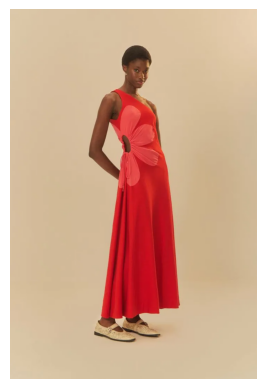

Red color clothing 1.00
Pink color clothing 0.73
Orange color clothing 0.66

clothes_images/328365_0105_2-SHORT-JEANS-CURVA.jpg


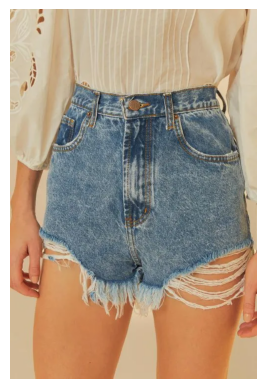

Black color clothing 1.00
White color clothing 0.98
Blue color clothing 0.94

clothes_images/328372_0142_1-CALCA-JEANS-UTOPIA.jpg


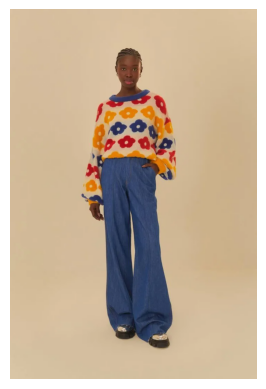

Black color clothing 1.00
Blue color clothing 0.98
White color clothing 0.94

clothes_images/329674_48230_2-SWEATER-TRICOT-ESTAMPADO-LISTRA-RAINBOW.jpg


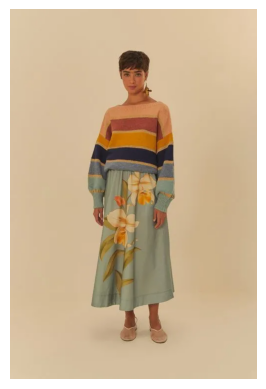

Brown color clothing 0.97
Green color clothing 0.90
White color clothing 0.74

clothes_images/329688_07421_1-PULL-TRICOT-ARTESANAL-FLORESv.webp


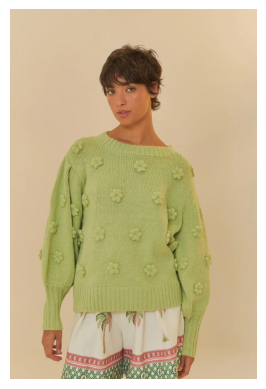

Green color clothing 0.99
White color clothing 0.98
Black color clothing 0.90

clothes_images/329688_8021_1-PULL-TRICOT-ARTESANAL-FLORES.jpg


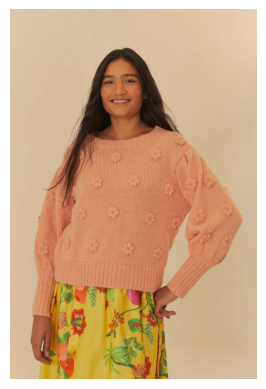

Red color clothing 0.99
Orange color clothing 0.76
Pink color clothing 0.62

clothes_images/329689_07423_2-PULL-TRICOT-ARTESANAL-BABADOS.jpg


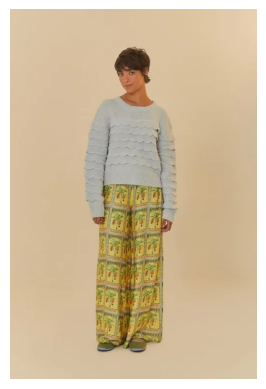

Green color clothing 1.00
White color clothing 0.94
Black color clothing 0.82

clothes_images/329757_04530_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


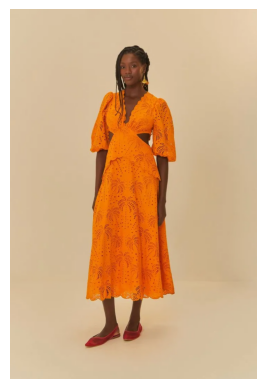

Orange color clothing 0.99
Yellow color clothing 0.89
Red color clothing 0.57

clothes_images/329757_05052_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


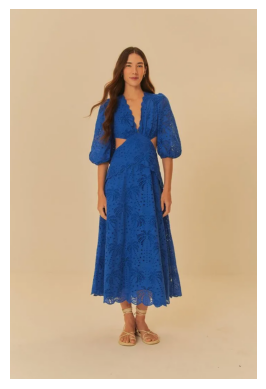

Blue color clothing 0.93
Black color clothing 0.80
White color clothing 0.62

clothes_images/329915_48336_2-VESTIDO-ALCA-ESTAMPADO-SEVILHA.jpg


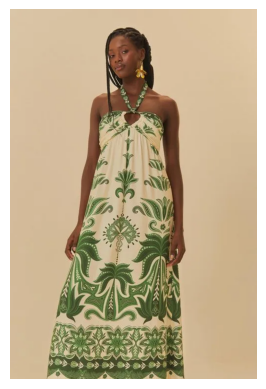

White color clothing 0.99
Green color clothing 0.99
Black color clothing 0.92

clothes_images/330027_05079_2-MACACAO-PLISSADO.jpg


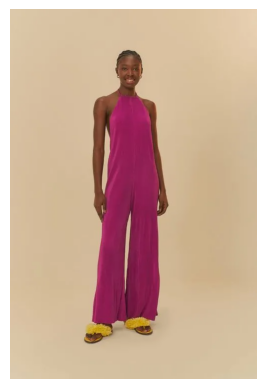

Purple color clothing 1.00
Pink color clothing 0.94
Red color clothing 0.45

clothes_images/330047_07413_1-VESTIDO-REGATA-MARIA.jpg


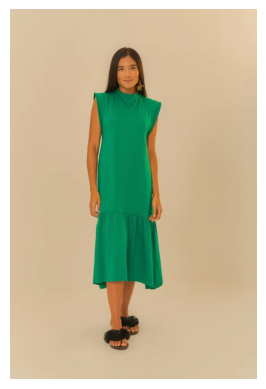

Green color clothing 1.00
White color clothing 0.97
Black color clothing 0.87

clothes_images/330102_02362_1-CAMISA-BOLSO-LONGA.jpg


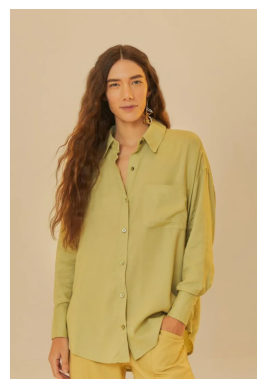

Brown color clothing 1.00
Green color clothing 0.81
Yellow color clothing 0.73

clothes_images/330102_05052_1-CAMISA-BOLSO-LONGA.jpg


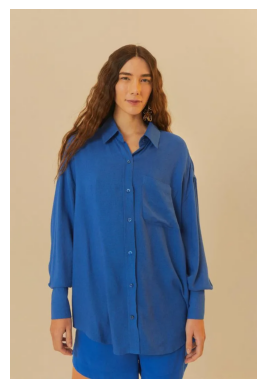

Black color clothing 0.99
Blue color clothing 0.99
White color clothing 0.93

clothes_images/330102_07415_1-CAMISA-BOLSO-LONGA.jpg


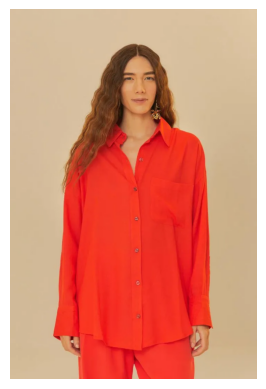

Orange color clothing 0.93
Red color clothing 0.89
Yellow color clothing 0.56

clothes_images/330138_0024_2-VESTIDO-LONGO-MARIAS.jpg


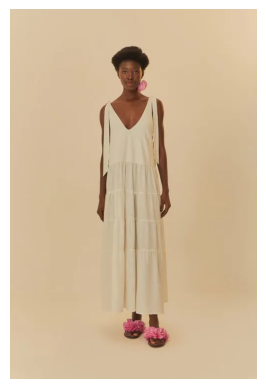

White color clothing 0.99
Black color clothing 0.99
Green color clothing 0.92

clothes_images/330138_05052_2-VESTIDO-LONGO-MARIAS.jpg


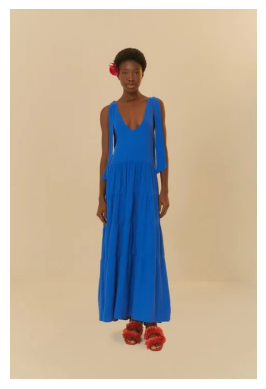

Blue color clothing 0.98
Black color clothing 0.88
White color clothing 0.73

clothes_images/330139_07412_2-VESTIDO-LONGO-ALCAS.jpg


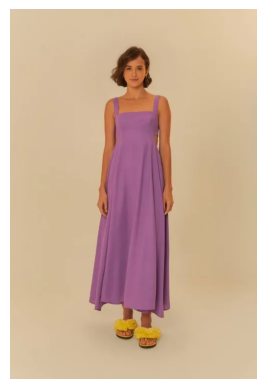

Purple color clothing 0.98
Pink color clothing 0.82
Blue color clothing 0.31

clothes_images/330139_07416_1-VESTIDO-LONGO-ALCAS.jpg


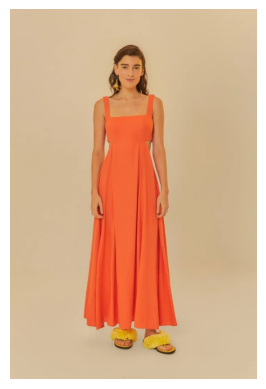

Orange color clothing 0.93
Red color clothing 0.89
Yellow color clothing 0.57

clothes_images/330148_07412_2-VESTIDO-MANGAS-PREGAS.jpg


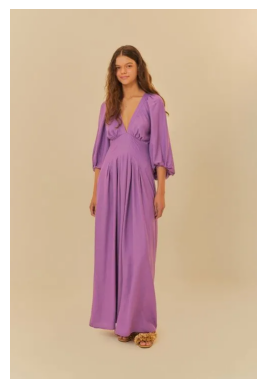

Purple color clothing 0.99
Pink color clothing 0.84
Blue color clothing 0.28

clothes_images/330149_07414_1-MACACAO-CENOURA-RECORTES.jpg


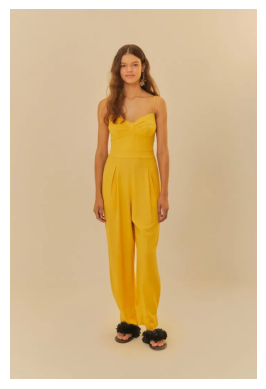

Yellow color clothing 1.00
Orange color clothing 0.81
Brown color clothing 0.80

clothes_images/330152_07415_1-MACACAO-PREGAS-PANTALONA.jpg


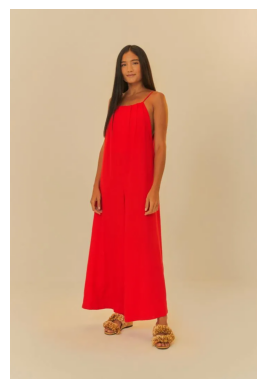

Red color clothing 1.00
Pink color clothing 0.71
Orange color clothing 0.67

clothes_images/330154_05079_2-MACACAO-ALCINHAS-PANTALONA.jpg


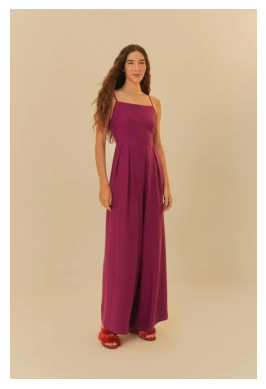

Purple color clothing 1.00
Pink color clothing 0.91
Red color clothing 0.38

clothes_images/330156_04530_1-VESTIDO-CURTO-CORSELET.jpg


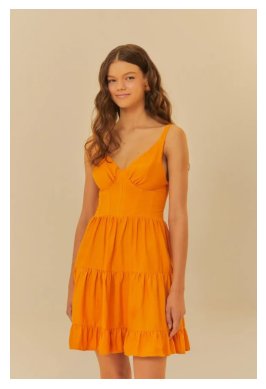

Orange color clothing 0.98
Yellow color clothing 0.92
Red color clothing 0.51

clothes_images/330156_07412_1-VESTIDO-CURTO-CORSELET.jpg


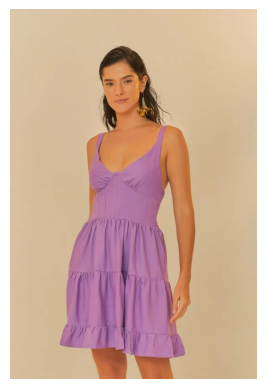

Purple color clothing 0.99
Pink color clothing 0.83
Blue color clothing 0.29

clothes_images/330157_05052_1-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


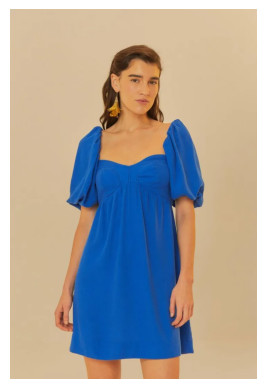

Blue color clothing 1.00
Black color clothing 0.95
White color clothing 0.84

clothes_images/330157_07413_1-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


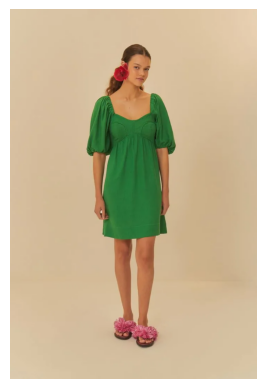

Green color clothing 0.99
White color clothing 0.90
Brown color clothing 0.86

clothes_images/330157_07414_2-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


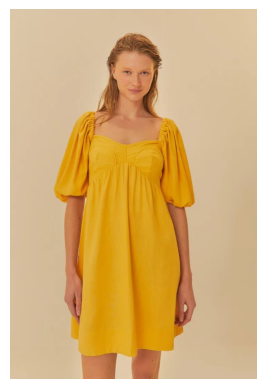

Yellow color clothing 1.00
Brown color clothing 0.82
Orange color clothing 0.79

clothes_images/330158_07415_1-VESTIDO-CURTO-OMBRO-SO.jpg


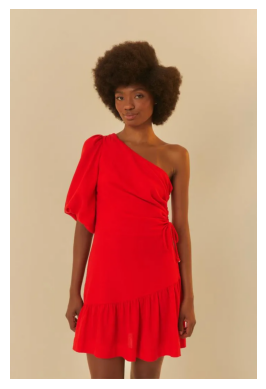

Red color clothing 0.99
Orange color clothing 0.78
Pink color clothing 0.59

clothes_images/330163_0013_1-VESTIDO-ALCINHAS-LISTRAS.jpg


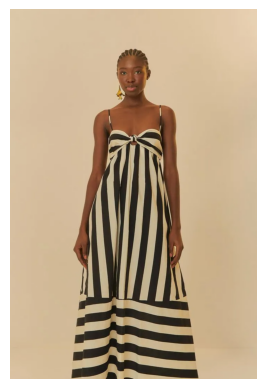

Black color clothing 1.00
White color clothing 0.98
Blue color clothing 0.95

clothes_images/330163_05052_2-VESTIDO-ALCINHAS-LISTRAS.jpg


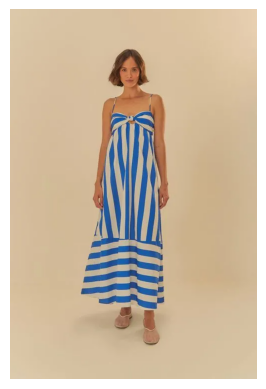

Black color clothing 1.00
Blue color clothing 0.97
White color clothing 0.95

clothes_images/330169_07413_2-CALCA-RETA-COS-LARGO.jpg


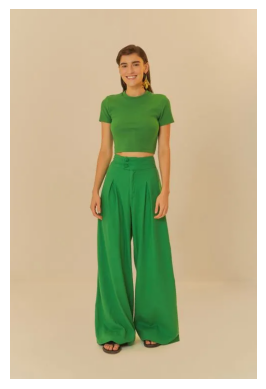

Green color clothing 0.96
Brown color clothing 0.92
White color clothing 0.84

clothes_images/330169_07415_2-CALCA-RETA-COS-LARGO.jpg


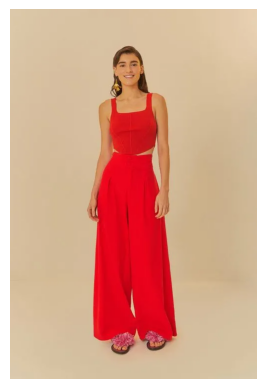

Red color clothing 0.98
Pink color clothing 0.85
Purple color clothing 0.55

clothes_images/330173_0013_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


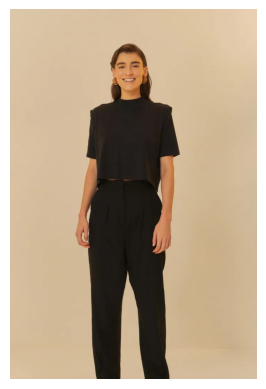

Black color clothing 1.00
White color clothing 0.97
Blue color clothing 0.95

clothes_images/330173_0024_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


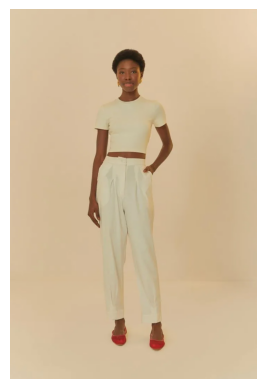

Green color clothing 1.00
White color clothing 0.97
Black color clothing 0.88

clothes_images/330173_07416_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


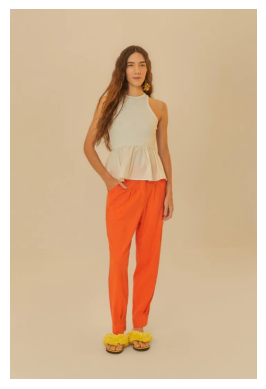

Orange color clothing 0.99
Yellow color clothing 0.89
Red color clothing 0.56

clothes_images/330200_05052_2-BLAZER-BOLSO-LONGO.jpg


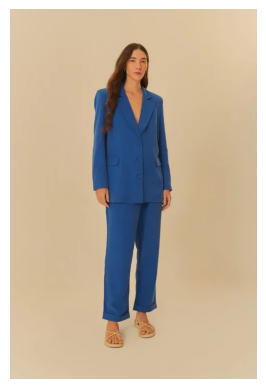

Blue color clothing 0.94
Black color clothing 0.80
White color clothing 0.62

clothes_images/330362_48218_2-MACACAO-ESTAMPADO-BANANARTE.jpg


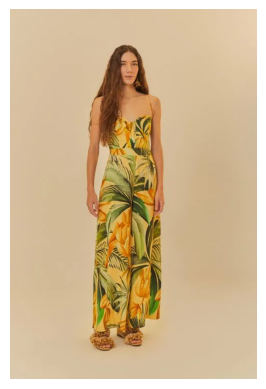

Brown color clothing 0.99
Yellow color clothing 0.85
Green color clothing 0.68

clothes_images/330451_48302_2-VESTIDO-CROPPED-ESTAMPADO-DUDA.jpg


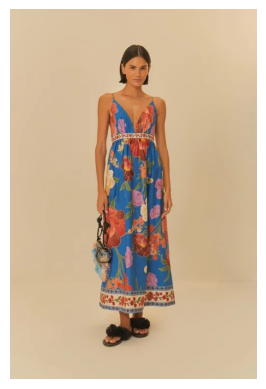

Purple color clothing 0.82
Blue color clothing 0.67
Pink color clothing 0.51

clothes_images/331705_0101_1-JAQUETA-JEANS-CROPPED.jpg


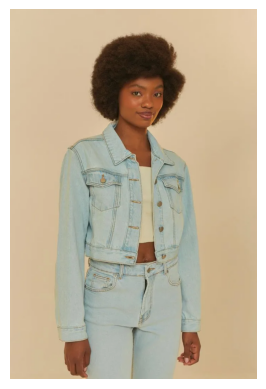

White color clothing 1.00
Green color clothing 0.98
Black color clothing 0.94

clothes_images/331714_0142_2-CALCA-JEANS-WIDE-RECORTE.jpg


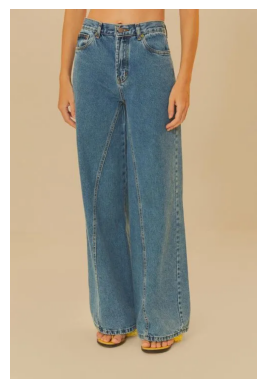

Blue color clothing 0.99
Black color clothing 0.93
White color clothing 0.80

clothes_images/331733_0142_2-SAIA-JEANS-MIDI-GODE.jpg


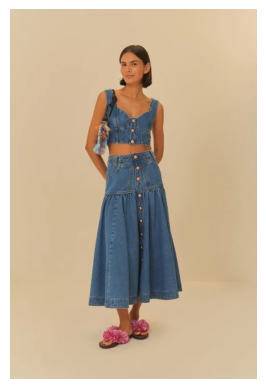

Blue color clothing 0.95
Black color clothing 0.83
White color clothing 0.66

clothes_images/332043_48315_2-VESTIDO-CURTO-ESTAMPADO-MILANI-COQUEIROS.jpg


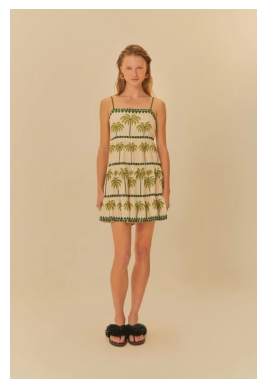

Brown color clothing 0.96
Green color clothing 0.91
White color clothing 0.75

clothes_images/332046_48295_1-CALCA-PANTALONA-ESTAMPADA-HELOISA.jpg


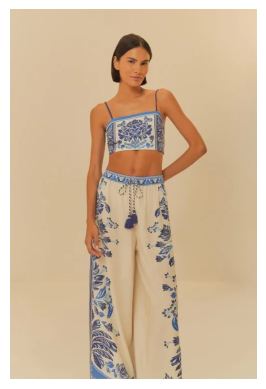

Blue color clothing 1.00
Black color clothing 0.97
White color clothing 0.88

clothes_images/332928_48288_2-SAIA-MOLETOM-ESTAMPADA-SONHO-DOS-PASSAROS.jpg


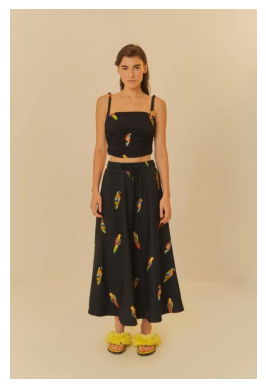

Green color clothing 0.95
Brown color clothing 0.93
White color clothing 0.82

clothes_images/332972_48323_2-VESTIDO-CROPPED-ESTAMPADO-CHITA-BELLA-FLOR.jpg


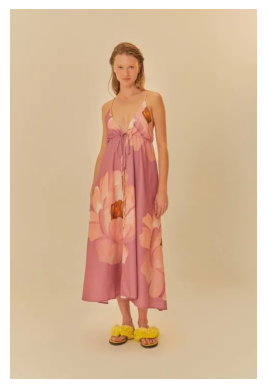

Pink color clothing 1.00
Purple color clothing 0.87
Red color clothing 0.77

clothes_images/333108_48983_1-VESTIDO-CURTO-ESTAMPADO-FLORAL-ERIKA.jpg


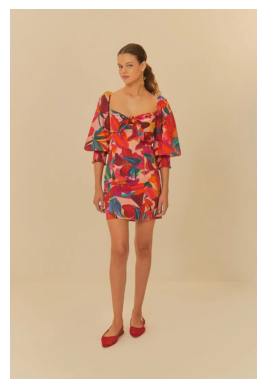

Red color clothing 0.93
Pink color clothing 0.92
Purple color clothing 0.68

clothes_images/333122_48978_2-CALCA-TAMBAQUI-DECORADO.jpg


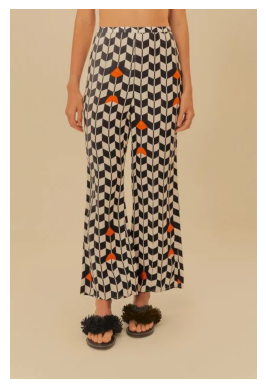

Brown color clothing 0.96
Green color clothing 0.91
White color clothing 0.75

clothes_images/334370_07415_2-REGATA-BASICA-QUADRADA.jpg


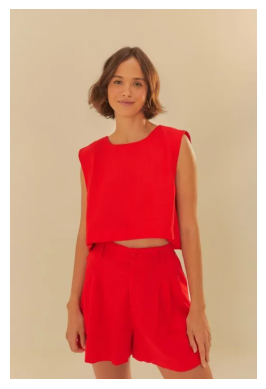

Red color clothing 1.00
Pink color clothing 0.69
Orange color clothing 0.69

clothes_images/334828_48302_2-MACAQUINHO-ESTAMPADO-DUDA.jpg


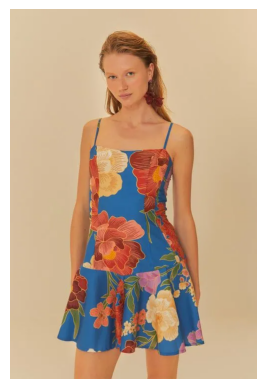

Brown color clothing 0.99
Green color clothing 0.85
Yellow color clothing 0.69

clothes_images/335138_0013_2-SAIA-AMPLA-BOLSO.jpg


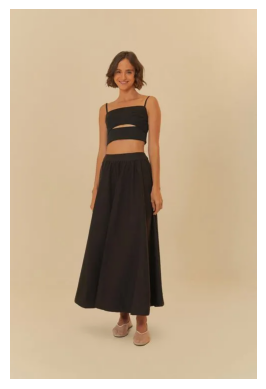

Blue color clothing 1.00
Black color clothing 0.98
White color clothing 0.89

clothes_images/338842_49083_2-TOP-PAPILLON.jpg


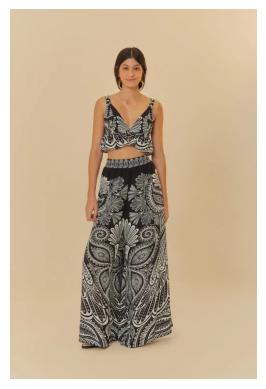

Blue color clothing 1.00
Black color clothing 0.97
White color clothing 0.87

clothes_images/339080_05052_2-CALCA-FAIXA-CLOCHARD.jpg


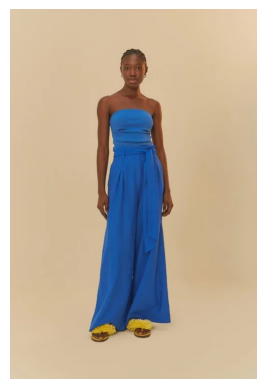

Blue color clothing 1.00
Black color clothing 0.94
White color clothing 0.83



In [260]:
# Embeddings com pca para cores
cores_embeddings_pca = pca.transform(cores_embeddings)

# Aplicando o mesmo PCA nos embs das imagens
img_embeddings_pca = pca.transform(img_embs)

# para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
for i in range(img_embeddings_pca.shape[1]):
  min_value_color = cores_embeddings_pca[:, i].min()
  max_value_color = cores_embeddings_pca[:, i].max()
  min_value_img = img_embeddings_pca[:, i].min()
  max_value_img = img_embeddings_pca[:, i].max()
  img_embeddings_pca[:, i] = (img_embeddings_pca[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


cos_sim = util.cos_sim(img_embeddings_pca, cores_embeddings_pca)

# para cada imagem, vendo a semelhança com cada cor
for file_name, scores in zip(df['image_path'].values, cos_sim):
  print(file_name)
  plot_image(file_name)
  # top 3 colors:
  scores = scores.numpy()
  top_3_indices = scores.argsort()
  for i in range(3):
    print(description_list[top_3_indices[-i-1]], f"{scores[top_3_indices[-i-1]]:.2f}")
  print()

### Visualizando as duas primeiras dimensões do PCA

In [261]:
img_embeddings_pca.shape

(64, 2)

In [262]:
# Adicionando img_embeddings_pca ao df
pca_cols = [f'pca_{i}' for i in range(img_embeddings_pca.shape[1])]
print(pca_cols)
df[pca_cols] = img_embeddings_pca
print(f"df.shape: {df.shape}")
df.head(1)

['pca_0', 'pca_1']
df.shape: (64, 6)


,image_path,file_name,id,desc_produto,pca_0,pca_1
0,clothes_images/313278_02851_2-BLUSA-GOLA-MANGA...,313278_02851_2-BLUSA-GOLA-MANGAS,313278_02851,Blusa gola mangas,-0.083735,-2.192069


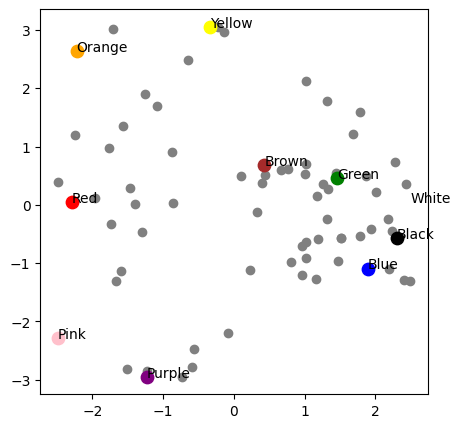

In [263]:
# Plot com as dimensões do PCA(X a dimensão 0, Y a dimensão 1) -usando apenas as duas primeiras dimensões de cores_embeddings_pca
plt.figure(figsize=(5, 5))

# Plotando alguns exemplos de imagens nesse plot de cores
sample = img_embeddings_pca


for i, (x, y) in enumerate(sample[:, :2]):
    plt.scatter(x, y, color='gray')

for i, (x, y) in enumerate(cores_embeddings_pca[:, :2]):
    color = description_list[i].replace(" color clothing", "").replace("Roupa da cor ", "")
    # plotting colored according to the color value
    plt.scatter(x, y, color=color, s=80)
    plt.text(x, y, color)


### Testando em 3d

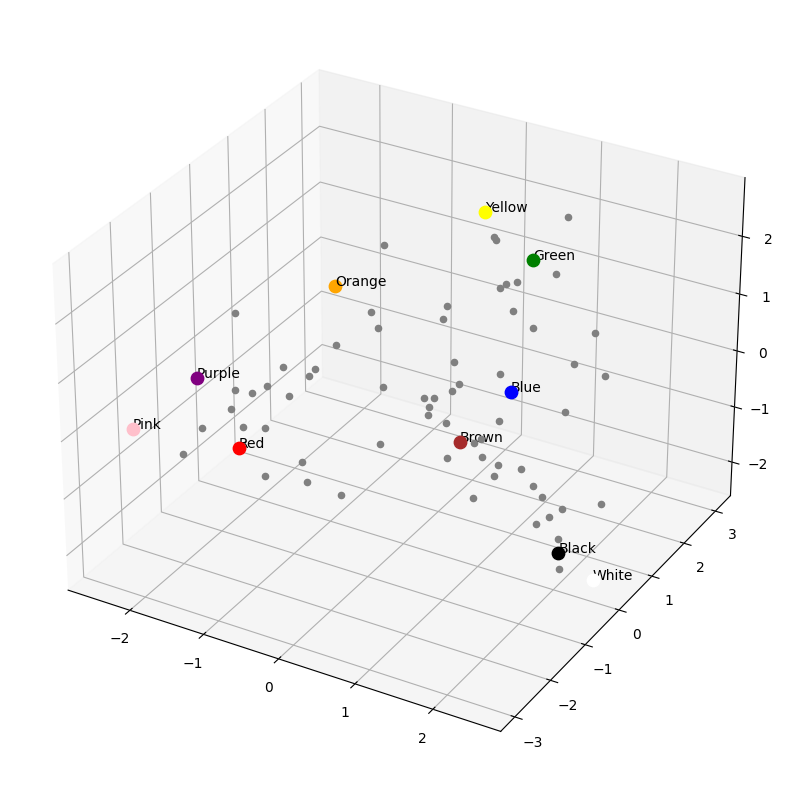

In [264]:
# Refazendo PCA com 3 dimensões
pca = PCA(n_components=3)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
img_embeddings_pca = pca.transform(img_embs)

# para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
for i in range(img_embeddings_pca.shape[1]):
  min_value_color = cores_embeddings_pca[:, i].min()
  max_value_color = cores_embeddings_pca[:, i].max()
  min_value_img = img_embeddings_pca[:, i].min()
  max_value_img = img_embeddings_pca[:, i].max()
  img_embeddings_pca[:, i] = (img_embeddings_pca[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color

cos_sim = util.cos_sim(img_embeddings_pca, cores_embeddings_pca)

# Plot 3d com as dimensões do PCA(X a dimensão 0, Y a dimensão 1, Z a dimensão 2) -usando as três primeiras dimensões de cores_embeddings_pca

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Plotando alguns exemplos de imagens nesse plot de cores
sample = img_embeddings_pca

for i, (x, y, z) in enumerate(sample[:, :3]):
    ax.scatter(x, y, z, color='gray')

for i, (x, y, z) in enumerate(cores_embeddings_pca[:, :3]):
    color = description_list[i].replace(" color clothing", "").replace("Roupa da cor ", "")
    # plotting colored according to the color value
    ax.scatter(x, y, z, color=color, s=80)
    ax.text(x, y, z, color)


clothes_images/313278_02851_2-BLUSA-GOLA-MANGAS.jpg


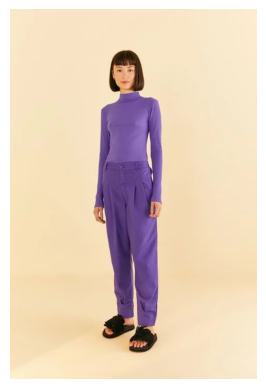

Purple color clothing 0.93
Blue color clothing 0.64
Pink color clothing 0.52

clothes_images/317431_0700_2-CROPPED-MANGA-LONGA-ADIDAS-ESTAMPADO-SUNNY-DAY-VIVID-RED.jpg


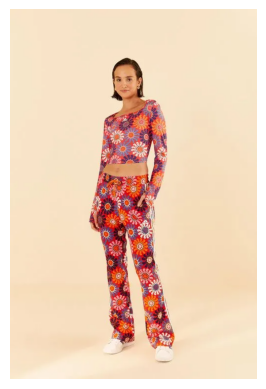

Pink color clothing 0.98
Red color clothing 0.76
Purple color clothing 0.64

clothes_images/323253_0013_1-CALCA-BICOLOR-ALFAIATARIA.jpg


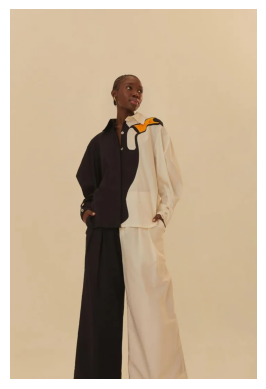

White color clothing 0.95
Black color clothing 0.89
Brown color clothing 0.81

clothes_images/323253_07032_1-CALCA-BICOLOR-ALFAIATARIA.jpg


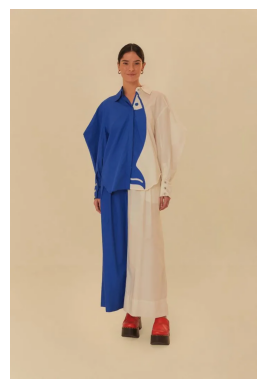

Black color clothing 0.84
Blue color clothing 0.83
White color clothing 0.67

clothes_images/324277_0012_1-CALCA-SARJA-CARGO-COM-CINTO.jpg


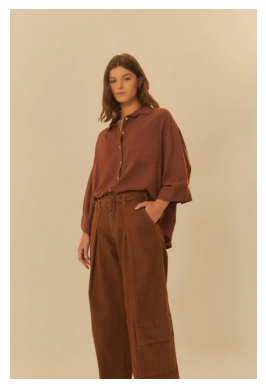

Brown color clothing 0.97
White color clothing 0.60
Orange color clothing 0.47

clothes_images/324786_0105_2-CALCA-JEANS-AMPLA-PREGAS-BAIXA.jpg


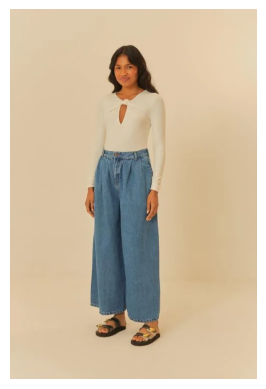

Black color clothing 0.92
White color clothing 0.79
Blue color clothing 0.73

clothes_images/325155_0700_2-CAMISA-ADIDAS-SOLAR-KALEIDOSCOPE-ROSA.jpg


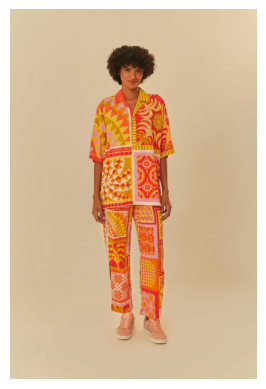

Orange color clothing 0.98
Red color clothing 0.71
Yellow color clothing 0.56

clothes_images/325496_46188_1-VESTIDO-CROCHET-ESTAMPADO-COBRA-YAWANAWA.jpg


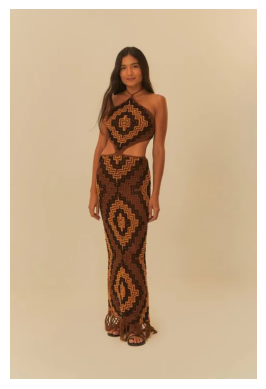

Brown color clothing 0.97
White color clothing 0.89
Black color clothing 0.74

clothes_images/325755_46189_2-CALCA-ESTAMPADA-COBRA-MAXI.jpg


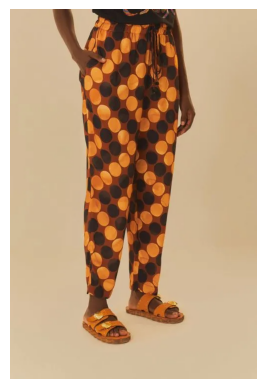

Orange color clothing 0.90
Yellow color clothing 0.85
Brown color clothing 0.48

clothes_images/327287_48291_1-VESTIDO-ESTAMPADO-AURORA-FLORAL.jpg


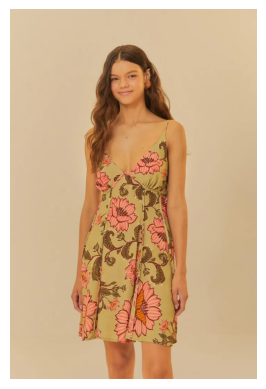

Orange color clothing 0.85
Yellow color clothing 0.84
Green color clothing 0.21

clothes_images/327917_0013_1-VESTIDO-BORDADO-AMAZONIA.jpg


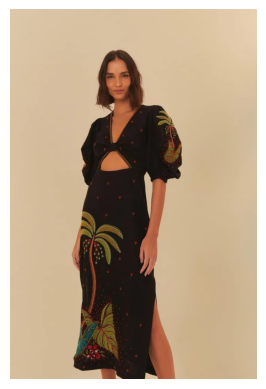

Black color clothing 0.81
White color clothing 0.76
Blue color clothing 0.64

clothes_images/327931_07058_1-VESTIDO-OMBRO-SO-ESTAMPADO-FLOR.jpg


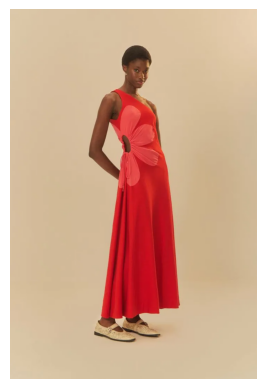

Red color clothing 0.98
Pink color clothing 0.52
Orange color clothing 0.47

clothes_images/328365_0105_2-SHORT-JEANS-CURVA.jpg


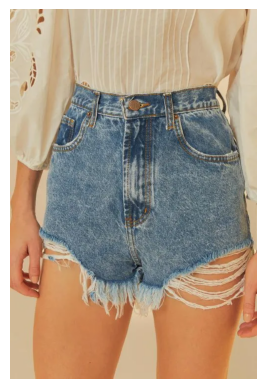

Black color clothing 1.00
White color clothing 0.96
Brown color clothing 0.58

clothes_images/328372_0142_1-CALCA-JEANS-UTOPIA.jpg


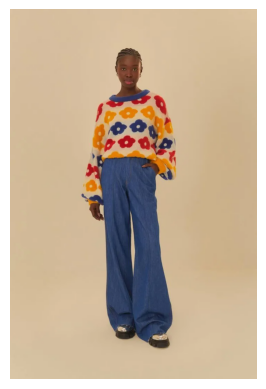

Blue color clothing 0.98
Green color clothing 0.75
Black color clothing 0.51

clothes_images/329674_48230_2-SWEATER-TRICOT-ESTAMPADO-LISTRA-RAINBOW.jpg


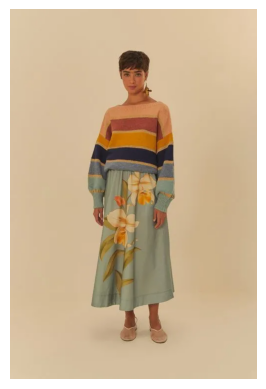

Green color clothing 0.97
Yellow color clothing 0.60
Blue color clothing 0.59

clothes_images/329688_07421_1-PULL-TRICOT-ARTESANAL-FLORESv.webp


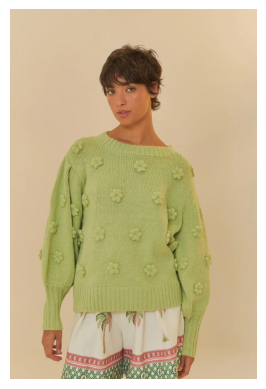

Green color clothing 1.00
Blue color clothing 0.78
Yellow color clothing 0.43

clothes_images/329688_8021_1-PULL-TRICOT-ARTESANAL-FLORES.jpg


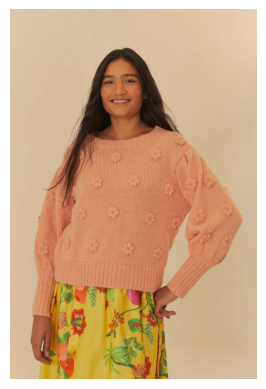

Orange color clothing 0.74
Red color clothing 0.68
Pink color clothing 0.60

clothes_images/329689_07423_2-PULL-TRICOT-ARTESANAL-BABADOS.jpg


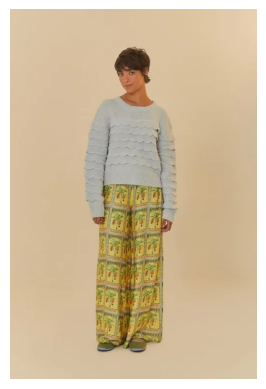

Green color clothing 0.96
Blue color clothing 0.76
Yellow color clothing 0.47

clothes_images/329757_04530_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


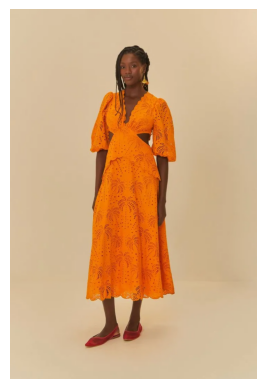

Orange color clothing 0.99
Yellow color clothing 0.74
Red color clothing 0.52

clothes_images/329757_05052_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


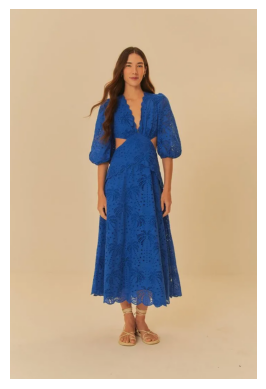

Blue color clothing 0.95
Green color clothing 0.63
Purple color clothing 0.59



In [265]:
# Vendo top 3 cores mais próximas para um sample de imagens
for file_name, scores in zip(df['image_path'].values[:20], cos_sim[:20]):
  print(file_name)
  plot_image(file_name)
  # top 3 colors:
  scores = scores.numpy()
  top_3_indices = scores.argsort()
  for i in range(3):
    print(description_list[top_3_indices[-i-1]], f"{scores[top_3_indices[-i-1]]:.2f}")
  print()

Insights:

- O modelo entende melhor algumas cores em inglês, como o purple (não identificou como roxo).
- O modelo não está compreendendo a cor preta
- Branco e preto estão muito próximos, talvez porque a descrição foi textual? (se usarmos imagens será que melhora?)
- Precisamos de um jeito de recortar o grupo da roupa que queremos analisar (Olhar só pra calça, por exemplo)

### Imagens personalizadas: bloco de cores

In [266]:
import os

# Agora, vamos gerar os embeddings das imagens das cores (color_images)
pasta = "color_images"

# Criando lista com as image_paths da pasta
image_paths = [os.path.join(pasta, path).replace('\\','/') for path in os.listdir(pasta)]

# Criando um df_color com os nomes das imagens
df_color = pd.DataFrame(image_paths, columns=["image_path"])
df_color["color_name"] = df_color["image_path"].apply(lambda x: x.split("/")[-1].split(".")[0])

In [267]:
# Criando colunas para os embeddings
emb_columns = [f"emb_img_{i}" for i in range(512)]

# Now we load and encode the images
def load_image(url_or_path):
    if url_or_path.startswith("http://") or url_or_path.startswith("https://"):
        return Image.open(requests.get(url_or_path, stream=True).raw)
    else:
        return Image.open(url_or_path)

file_names = df_color['image_path'].values
images = [load_image(img) for img in file_names]
img_embeddings = img_model.encode(images)

# Colocando os embeddings no df
emb_dict = {}
for i, emb in enumerate(img_embeddings):
    emb_id = df_color.iloc[i]["color_name"]
    emb_dict[emb_id] = emb

df_color_embs = pd.DataFrame(emb_dict).T

df_color_embs.columns = emb_columns
df_color_embs["color_name"] = df_color_embs.index

df_color_embs = df_color_embs.reset_index(drop=True)[["color_name"] + emb_columns]

In [268]:
df_color_embs.head()

,color_name,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
0,COR AMARELO,-0.028546,-0.025496,-0.417673,-0.056401,-0.140226,-0.443518,-0.168441,1.078504,-0.078835,...,0.232356,0.274418,0.405922,-0.071532,-0.292983,0.232331,-0.101903,0.777710,0.010010,-0.121242
1,COR AZUL,0.006238,-0.045781,-0.431332,-0.097486,-0.076914,-0.385147,-0.291344,1.304192,0.383190,...,0.180391,0.044304,0.326409,-0.031872,-0.116065,0.203804,-0.297466,0.716893,-0.139596,-0.128783
2,COR BRANCO,-0.073344,-0.132770,0.253046,-0.082826,0.171033,-0.083862,-0.289973,1.193479,-0.287285,...,0.279241,-0.072687,0.708488,-0.181231,-0.050427,-0.001854,-0.256473,0.840973,-0.169232,-0.228157
3,COR LARANJA,-0.082441,-0.087324,-0.115958,-0.285204,-0.273470,-0.187084,-0.188147,1.037961,0.035577,...,0.334134,0.222016,0.296361,0.105041,-0.340744,0.146224,-0.089053,0.782470,-0.034351,-0.270654
4,COR MARROM,0.129687,-0.148728,-0.106386,-0.164460,0.040059,-0.307845,-0.089132,0.950700,-0.319955,...,0.173314,0.059059,0.779322,0.071892,-0.055109,0.132718,-0.255734,0.735227,-0.228709,-0.160291


In [269]:
df_color_embs

,color_name,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
0,COR AMARELO,-0.028546,-0.025496,-0.417673,-0.056401,-0.140226,-0.443518,-0.168441,1.078504,-0.078835,...,0.232356,0.274418,0.405922,-0.071532,-0.292983,0.232331,-0.101903,0.777710,0.010010,-0.121242
1,COR AZUL,0.006238,-0.045781,-0.431332,-0.097486,-0.076914,-0.385147,-0.291344,1.304192,0.383190,...,0.180391,0.044304,0.326409,-0.031872,-0.116065,0.203804,-0.297466,0.716893,-0.139596,-0.128783
2,COR BRANCO,-0.073344,-0.132770,0.253046,-0.082826,0.171033,-0.083862,-0.289973,1.193479,-0.287285,...,0.279241,-0.072687,0.708488,-0.181231,-0.050427,-0.001854,-0.256473,0.840973,-0.169232,-0.228157
3,COR LARANJA,-0.082441,-0.087324,-0.115958,-0.285204,-0.273470,-0.187084,-0.188147,1.037961,0.035577,...,0.334134,0.222016,0.296361,0.105041,-0.340744,0.146224,-0.089053,0.782470,-0.034351,-0.270654
4,COR MARROM,0.129687,-0.148728,-0.106386,-0.164460,0.040059,-0.307845,-0.089132,0.950700,-0.319955,...,0.173314,0.059059,0.779322,0.071892,-0.055109,0.132718,-0.255734,0.735227,-0.228709,-0.160291
5,COR PRETO,-0.150350,-0.263389,-0.565511,-0.072226,0.155786,-0.043085,-0.387121,1.272081,0.283594,...,-0.079255,0.158420,0.648814,0.091011,-0.028377,-0.349301,-0.134815,0.772287,-0.364340,-0.293392
6,COR ROSA,-0.232607,-0.244402,-0.232435,-0.443345,-0.170635,-0.438234,-0.085661,1.015443,0.581087,...,0.050129,-0.196673,0.175514,-0.057394,0.017285,0.326810,-0.417590,0.759208,-0.005309,0.089440
7,COR ROXO,-0.040682,-0.236614,-0.166357,-0.177385,-0.007183,-0.484710,-0.252690,0.917476,0.151761,...,0.206618,0.219410,0.186061,-0.069840,-0.291403,0.162623,-0.207237,0.765841,-0.102973,0.039640
8,COR VERDE,0.041701,-0.172500,-0.322558,-0.331832,-0.085318,-0.456009,-0.269159,1.154621,-0.010214,...,0.428415,0.234530,0.443848,-0.184218,-0.117773,-0.014541,-0.146755,0.745211,-0.273161,-0.027780
9,COR VERMELHO,0.002639,-0.210456,-0.319800,-0.206563,-0.054426,-0.474577,-0.110277,1.187309,0.389176,...,0.233479,0.212013,0.133250,-0.031382,-0.130833,0.189375,-0.217279,0.767863,-0.050193,-0.035196


In [270]:
# Pegando só as colunas de embeddings de df_color_embs
color_img_cols = [col for col in df_color_embs.columns if 'emb_img_' in col]
cores_embeddings = df_color_embs[color_img_cols].values

# Usar PCA nos embs das cores
pca = PCA(n_components=2)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
cores_embeddings_pca.shape

(10, 2)

In [271]:
# Pegando as colunas de embeddings de df_img_embs
img_cols = [col for col in df_img_embs.columns if 'emb_img_' in col]
img_embs = df_img_embs[img_cols].values

clothes_images/313278_02851_2-BLUSA-GOLA-MANGAS.jpg


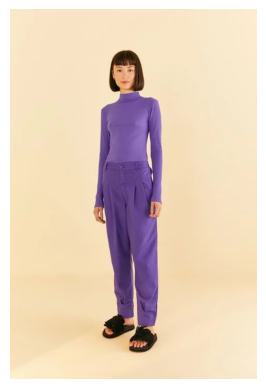

COR ROSA 1.00
COR VERDE 0.97
COR ROXO 0.97

clothes_images/317431_0700_2-CROPPED-MANGA-LONGA-ADIDAS-ESTAMPADO-SUNNY-DAY-VIVID-RED.jpg


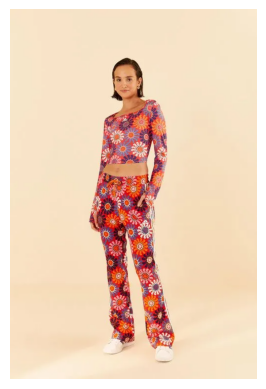

COR VERMELHO 0.67
COR VERDE 0.65
COR PRETO 0.49

clothes_images/323253_0013_1-CALCA-BICOLOR-ALFAIATARIA.jpg


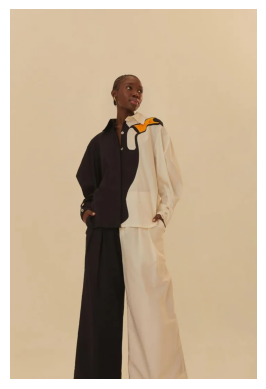

COR AZUL 0.99
COR PRETO 0.95
COR BRANCO 0.56

clothes_images/323253_07032_1-CALCA-BICOLOR-ALFAIATARIA.jpg


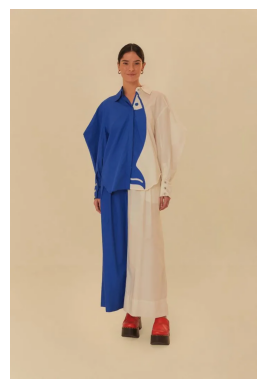

COR PRETO 0.99
COR AZUL 0.94
COR BRANCO 0.12

clothes_images/324277_0012_1-CALCA-SARJA-CARGO-COM-CINTO.jpg


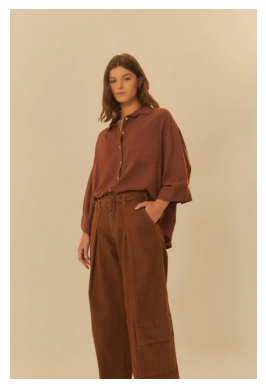

COR BRANCO 0.93
COR MARROM 0.89
COR AMARELO 0.64

clothes_images/324786_0105_2-CALCA-JEANS-AMPLA-PREGAS-BAIXA.jpg


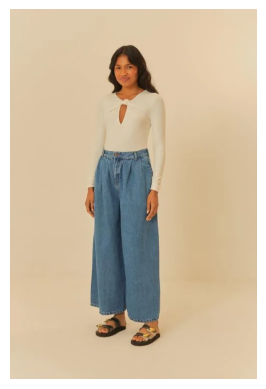

COR AZUL 0.94
COR PRETO 0.85
COR BRANCO 0.73

clothes_images/325155_0700_2-CAMISA-ADIDAS-SOLAR-KALEIDOSCOPE-ROSA.jpg


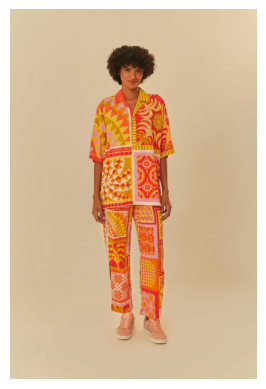

COR PRETO 0.69
COR AZUL 0.54
COR VERMELHO 0.46

clothes_images/325496_46188_1-VESTIDO-CROCHET-ESTAMPADO-COBRA-YAWANAWA.jpg


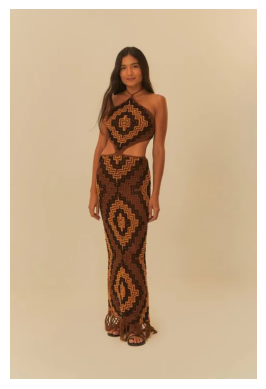

COR MARROM 0.91
COR BRANCO 0.91
COR AMARELO 0.69

clothes_images/325755_46189_2-CALCA-ESTAMPADA-COBRA-MAXI.jpg


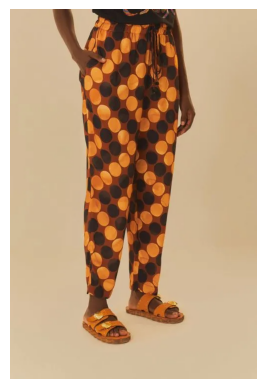

COR AZUL 1.00
COR PRETO 0.97
COR BRANCO 0.48

clothes_images/327287_48291_1-VESTIDO-ESTAMPADO-AURORA-FLORAL.jpg


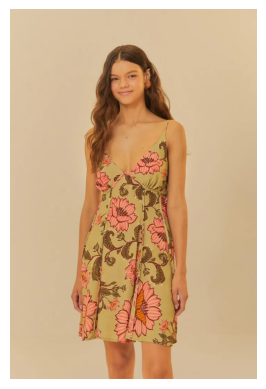

COR BRANCO 0.95
COR MARROM 0.85
COR AMARELO 0.59

clothes_images/327917_0013_1-VESTIDO-BORDADO-AMAZONIA.jpg


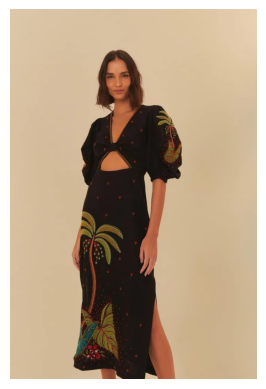

COR BRANCO 0.88
COR AZUL 0.81
COR PRETO 0.69

clothes_images/327931_07058_1-VESTIDO-OMBRO-SO-ESTAMPADO-FLOR.jpg


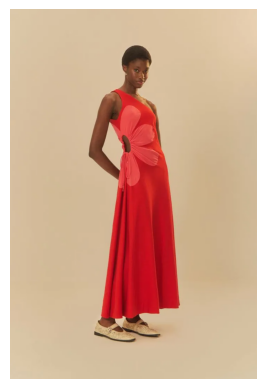

COR VERMELHO 0.65
COR VERDE 0.63
COR PRETO 0.50

clothes_images/328365_0105_2-SHORT-JEANS-CURVA.jpg


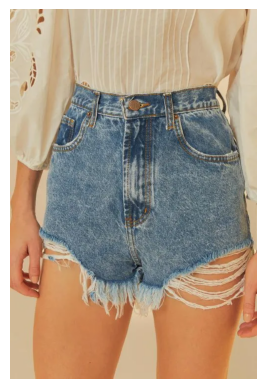

COR AZUL 0.99
COR PRETO 0.95
COR BRANCO 0.55

clothes_images/328372_0142_1-CALCA-JEANS-UTOPIA.jpg


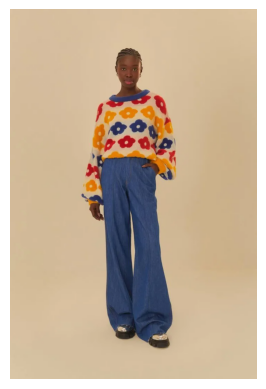

COR AZUL 1.00
COR PRETO 0.97
COR BRANCO 0.48

clothes_images/329674_48230_2-SWEATER-TRICOT-ESTAMPADO-LISTRA-RAINBOW.jpg


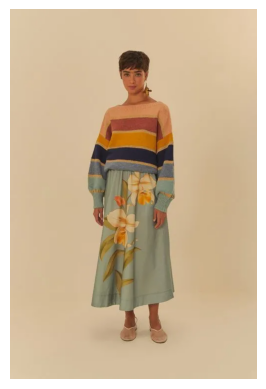

COR AZUL 0.94
COR PRETO 0.87
COR BRANCO 0.71

clothes_images/329688_07421_1-PULL-TRICOT-ARTESANAL-FLORESv.webp


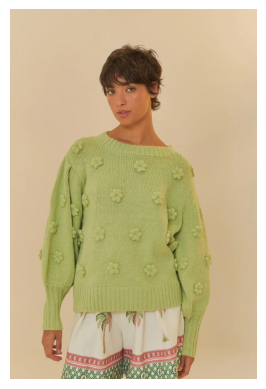

COR BRANCO 0.88
COR AZUL 0.81
COR PRETO 0.69

clothes_images/329688_8021_1-PULL-TRICOT-ARTESANAL-FLORES.jpg


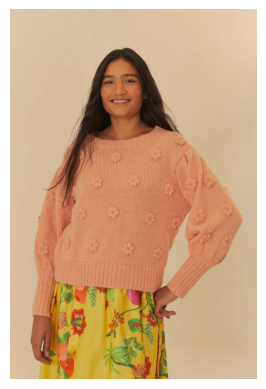

COR BRANCO 0.85
COR AZUL 0.84
COR PRETO 0.73

clothes_images/329689_07423_2-PULL-TRICOT-ARTESANAL-BABADOS.jpg


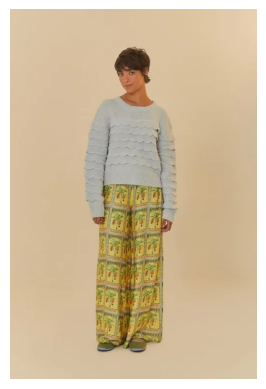

COR AZUL 0.99
COR PRETO 0.94
COR BRANCO 0.57

clothes_images/329757_04530_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


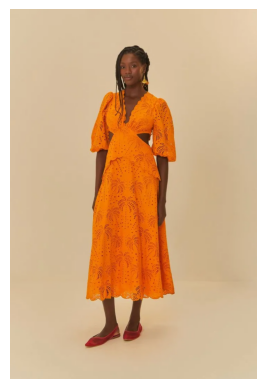

COR PRETO 0.84
COR AZUL 0.72
COR VERMELHO 0.24

clothes_images/329757_05052_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


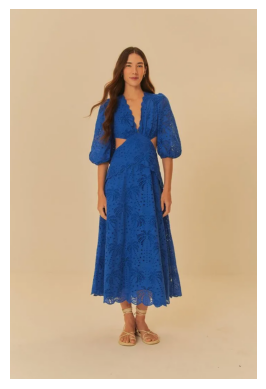

COR LARANJA 0.99
COR ROXO 0.97
COR ROSA 0.88

clothes_images/329915_48336_2-VESTIDO-ALCA-ESTAMPADO-SEVILHA.jpg


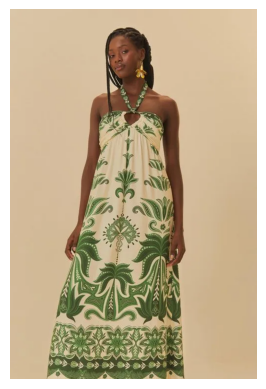

COR AZUL 0.97
COR PRETO 0.91
COR BRANCO 0.64

clothes_images/330027_05079_2-MACACAO-PLISSADO.jpg


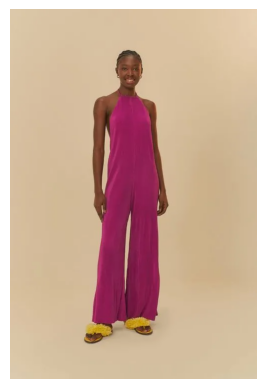

COR VERMELHO 0.64
COR VERDE 0.61
COR PRETO 0.52

clothes_images/330047_07413_1-VESTIDO-REGATA-MARIA.jpg


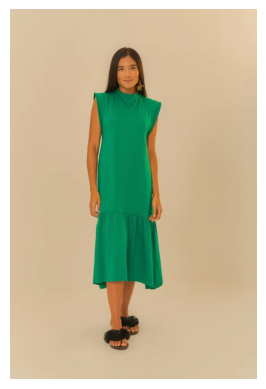

COR ROXO 1.00
COR ROSA 0.98
COR LARANJA 0.91

clothes_images/330102_02362_1-CAMISA-BOLSO-LONGA.jpg


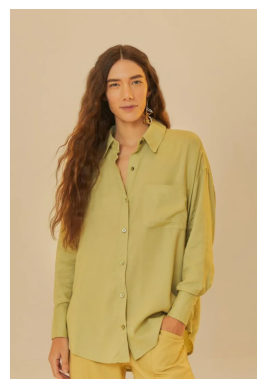

COR AZUL 0.99
COR PRETO 0.94
COR BRANCO 0.58

clothes_images/330102_05052_1-CAMISA-BOLSO-LONGA.jpg


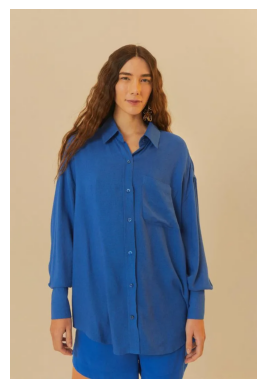

COR PRETO 1.00
COR AZUL 0.98
COR BRANCO 0.25

clothes_images/330102_07415_1-CAMISA-BOLSO-LONGA.jpg


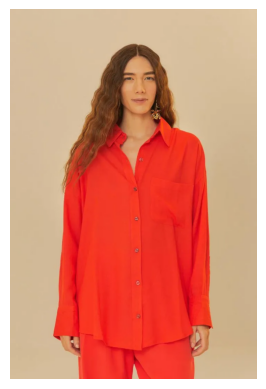

COR PRETO 0.63
COR VERMELHO 0.53
COR VERDE 0.50

clothes_images/330138_0024_2-VESTIDO-LONGO-MARIAS.jpg


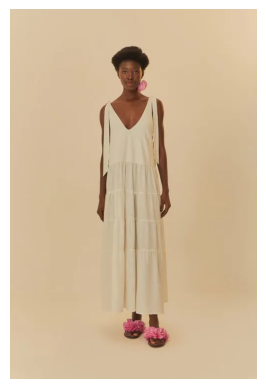

COR AZUL 0.95
COR PRETO 0.87
COR BRANCO 0.70

clothes_images/330138_05052_2-VESTIDO-LONGO-MARIAS.jpg


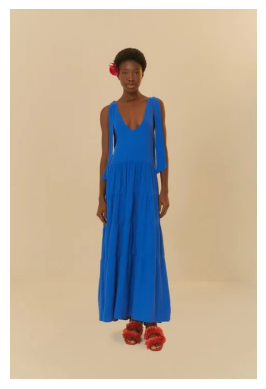

COR PRETO 0.93
COR AZUL 0.85
COR VERMELHO 0.04

clothes_images/330139_07412_2-VESTIDO-LONGO-ALCAS.jpg


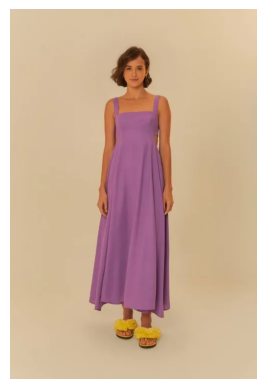

COR VERMELHO 0.83
COR VERDE 0.81
COR ROSA 0.63

clothes_images/330139_07416_1-VESTIDO-LONGO-ALCAS.jpg


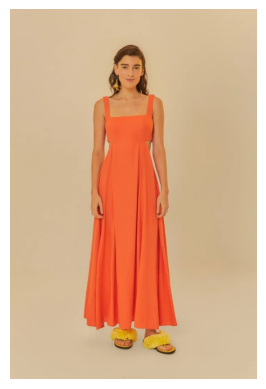

COR LARANJA 1.00
COR ROXO 0.92
COR ROSA 0.81

clothes_images/330148_07412_2-VESTIDO-MANGAS-PREGAS.jpg


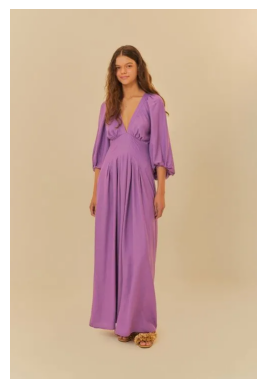

COR ROXO 1.00
COR ROSA 0.96
COR LARANJA 0.93

clothes_images/330149_07414_1-MACACAO-CENOURA-RECORTES.jpg


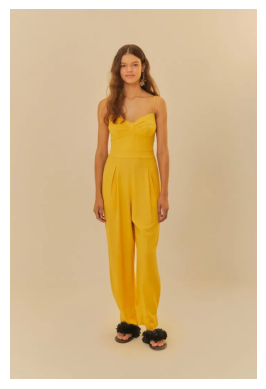

COR VERDE 1.00
COR VERMELHO 1.00
COR ROSA 0.97

clothes_images/330152_07415_1-MACACAO-PREGAS-PANTALONA.jpg


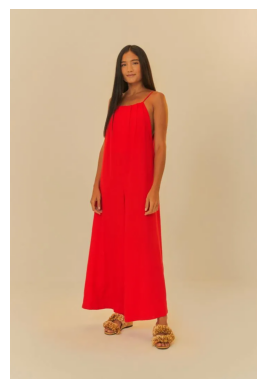

COR VERMELHO 0.87
COR VERDE 0.86
COR ROSA 0.69

clothes_images/330154_05079_2-MACACAO-ALCINHAS-PANTALONA.jpg


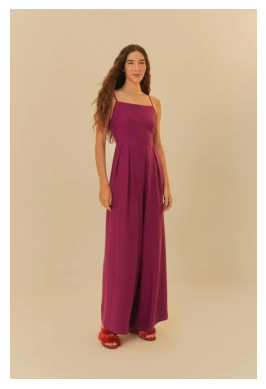

COR VERMELHO 0.94
COR VERDE 0.92
COR ROSA 0.79

clothes_images/330156_04530_1-VESTIDO-CURTO-CORSELET.jpg


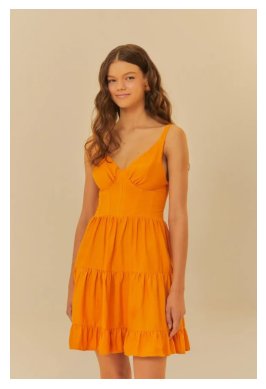

COR AMARELO 0.94
COR LARANJA 0.85
COR MARROM 0.74

clothes_images/330156_07412_1-VESTIDO-CURTO-CORSELET.jpg


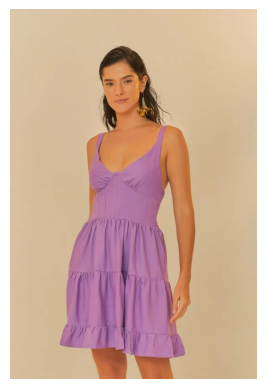

COR ROXO 1.00
COR ROSA 0.96
COR LARANJA 0.94

clothes_images/330157_05052_1-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


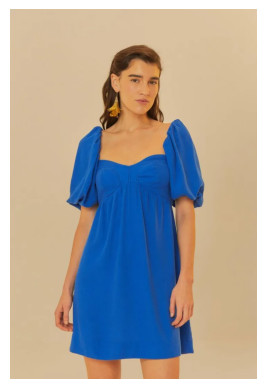

COR LARANJA 1.00
COR ROXO 0.92
COR ROSA 0.81

clothes_images/330157_07413_1-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


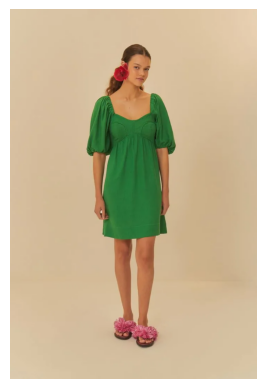

COR LARANJA 1.00
COR ROXO 0.92
COR ROSA 0.81

clothes_images/330157_07414_2-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


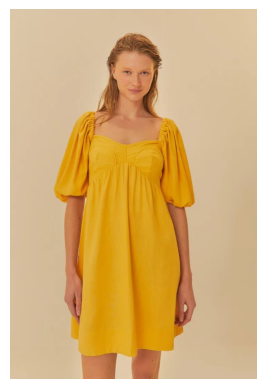

COR MARROM 0.94
COR BRANCO 0.88
COR AMARELO 0.73

clothes_images/330158_07415_1-VESTIDO-CURTO-OMBRO-SO.jpg


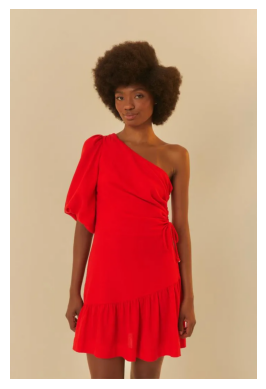

COR ROXO 1.00
COR ROSA 0.99
COR VERDE 0.91

clothes_images/330163_0013_1-VESTIDO-ALCINHAS-LISTRAS.jpg


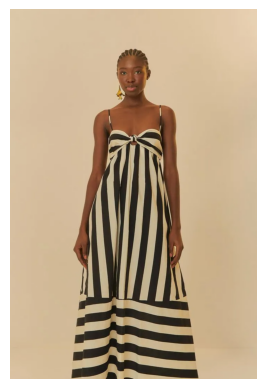

COR BRANCO 0.92
COR AZUL 0.76
COR PRETO 0.62

clothes_images/330163_05052_2-VESTIDO-ALCINHAS-LISTRAS.jpg


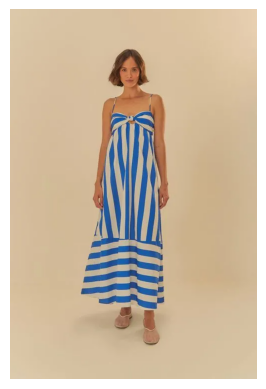

COR PRETO 0.96
COR AZUL 0.90
COR BRANCO -0.01

clothes_images/330169_07413_2-CALCA-RETA-COS-LARGO.jpg


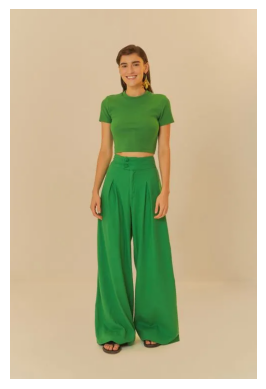

COR VERMELHO 0.63
COR VERDE 0.61
COR PRETO 0.52

clothes_images/330169_07415_2-CALCA-RETA-COS-LARGO.jpg


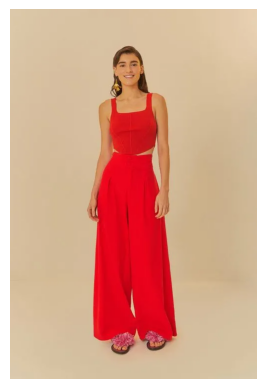

COR VERMELHO 0.86
COR VERDE 0.85
COR ROSA 0.68

clothes_images/330173_0013_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


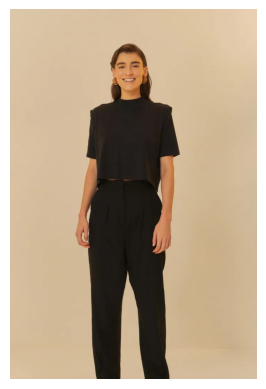

COR AZUL 1.00
COR PRETO 0.98
COR BRANCO 0.46

clothes_images/330173_0024_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


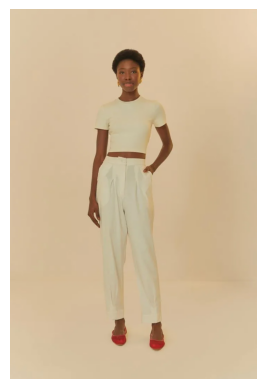

COR BRANCO 0.87
COR AZUL 0.83
COR PRETO 0.71

clothes_images/330173_07416_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


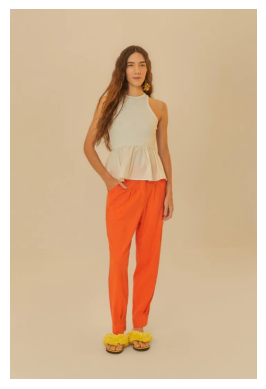

COR LARANJA 0.92
COR AMARELO 0.89
COR ROXO 0.68

clothes_images/330200_05052_2-BLAZER-BOLSO-LONGO.jpg


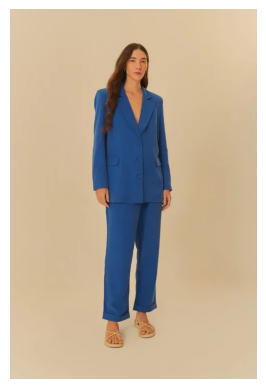

COR VERMELHO 0.96
COR VERDE 0.96
COR ROSA 0.84

clothes_images/330362_48218_2-MACACAO-ESTAMPADO-BANANARTE.jpg


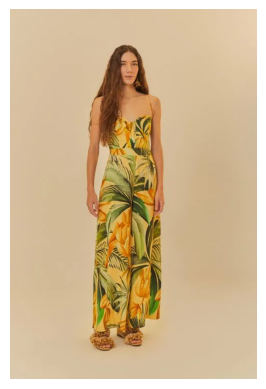

COR MARROM 0.93
COR BRANCO 0.89
COR AMARELO 0.71

clothes_images/330451_48302_2-VESTIDO-CROPPED-ESTAMPADO-DUDA.jpg


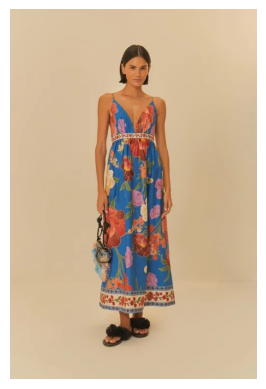

COR PRETO 0.99
COR AZUL 0.95
COR BRANCO 0.12

clothes_images/331705_0101_1-JAQUETA-JEANS-CROPPED.jpg


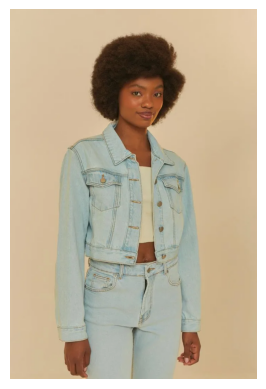

COR BRANCO 0.92
COR AZUL 0.76
COR PRETO 0.62

clothes_images/331714_0142_2-CALCA-JEANS-WIDE-RECORTE.jpg


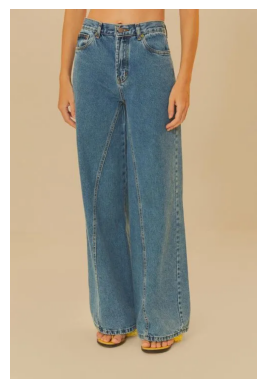

COR AZUL 0.95
COR PRETO 0.88
COR BRANCO 0.69

clothes_images/331733_0142_2-SAIA-JEANS-MIDI-GODE.jpg


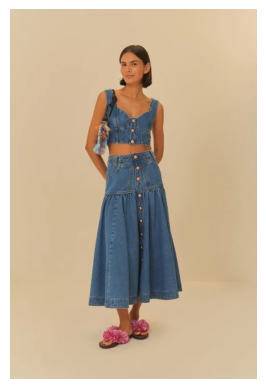

COR PRETO 0.97
COR AZUL 0.91
COR BRANCO 0.03

clothes_images/332043_48315_2-VESTIDO-CURTO-ESTAMPADO-MILANI-COQUEIROS.jpg


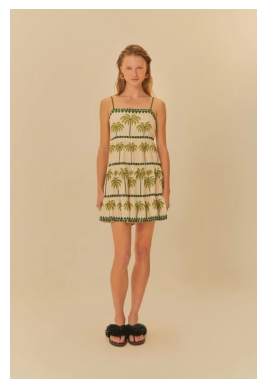

COR BRANCO 0.92
COR AZUL 0.75
COR PRETO 0.62

clothes_images/332046_48295_1-CALCA-PANTALONA-ESTAMPADA-HELOISA.jpg


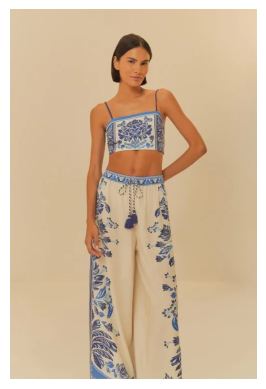

COR AZUL 0.98
COR PRETO 0.93
COR BRANCO 0.60

clothes_images/332928_48288_2-SAIA-MOLETOM-ESTAMPADA-SONHO-DOS-PASSAROS.jpg


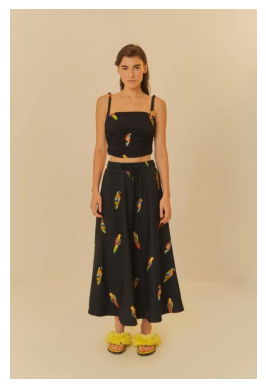

COR AZUL 0.90
COR PRETO 0.81
COR BRANCO 0.78

clothes_images/332972_48323_2-VESTIDO-CROPPED-ESTAMPADO-CHITA-BELLA-FLOR.jpg


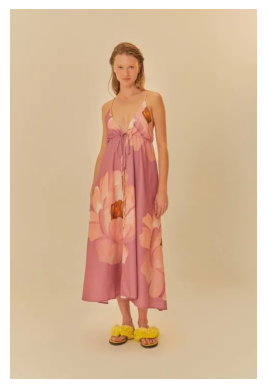

COR ROSA 1.00
COR ROXO 0.98
COR VERDE 0.95

clothes_images/333108_48983_1-VESTIDO-CURTO-ESTAMPADO-FLORAL-ERIKA.jpg


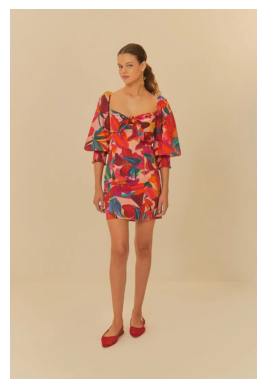

COR MARROM 0.98
COR AMARELO 0.98
COR BRANCO 0.50

clothes_images/333122_48978_2-CALCA-TAMBAQUI-DECORADO.jpg


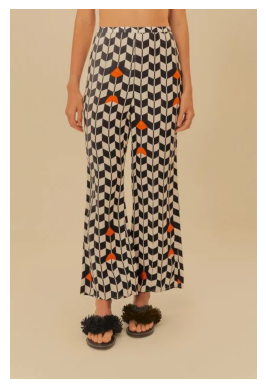

COR AZUL 0.99
COR PRETO 0.96
COR BRANCO 0.53

clothes_images/334370_07415_2-REGATA-BASICA-QUADRADA.jpg


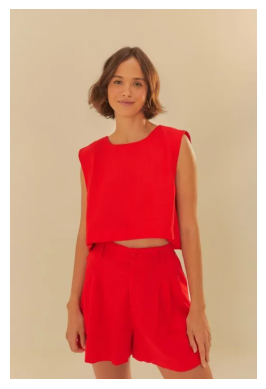

COR PRETO 0.96
COR AZUL 0.89
COR BRANCO -0.03

clothes_images/334828_48302_2-MACAQUINHO-ESTAMPADO-DUDA.jpg


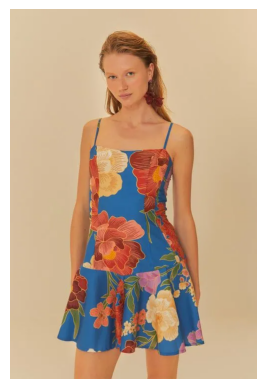

COR BRANCO 1.00
COR MARROM 0.66
COR AZUL 0.43

clothes_images/335138_0013_2-SAIA-AMPLA-BOLSO.jpg


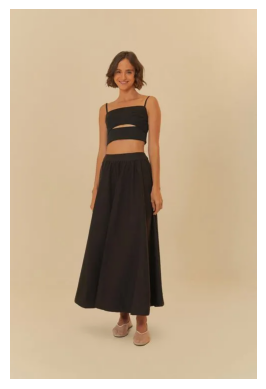

COR AZUL 0.99
COR PRETO 0.96
COR BRANCO 0.53

clothes_images/338842_49083_2-TOP-PAPILLON.jpg


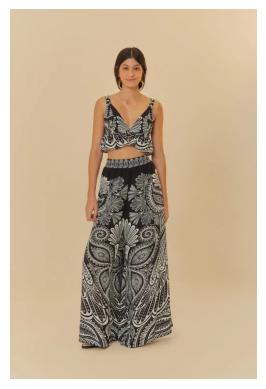

COR AZUL 0.96
COR PRETO 0.89
COR BRANCO 0.67

clothes_images/339080_05052_2-CALCA-FAIXA-CLOCHARD.jpg


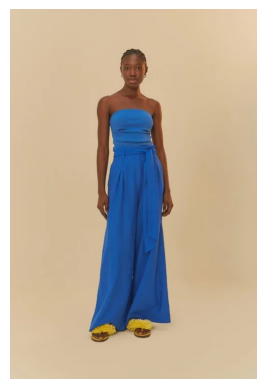

COR AZUL 0.96
COR PRETO 0.89
COR BRANCO 0.68



In [272]:
# Aplicando o mesmo PCA nos embs das imagens
img_embeddings_pca = pca.transform(img_embs)

# para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
for i in range(img_embeddings_pca.shape[1]):
  min_value_color = cores_embeddings_pca[:, i].min()
  max_value_color = cores_embeddings_pca[:, i].max()
  min_value_img = img_embeddings_pca[:, i].min()
  max_value_img = img_embeddings_pca[:, i].max()
  img_embeddings_pca[:, i] = (img_embeddings_pca[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


cos_sim = util.cos_sim(img_embeddings_pca, cores_embeddings_pca)

# para cada imagem, vendo a semelhança com cada cor
for file_name, scores in zip(df['image_path'].values, cos_sim):
  print(file_name)
  plot_image(file_name)
  # top 3 colors:
  scores = scores.numpy()
  top_3_indices = scores.argsort()
  for i in range(3):
    print(df_color.iloc[top_3_indices[-i-1]]['color_name'], f"{scores[top_3_indices[-i-1]]:.2f}")
  print()

In [274]:
import plotly.graph_objs as go

# refazendo PCA com 3 dimensões
pca = PCA(n_components=3)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
img_embeddings_pca = pca.transform(img_embs)

# para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
for i in range(img_embeddings_pca.shape[1]):
    min_value_color = cores_embeddings_pca[:, i].min()
    max_value_color = cores_embeddings_pca[:, i].max()
    min_value_img = img_embeddings_pca[:, i].min()
    max_value_img = img_embeddings_pca[:, i].max()
    img_embeddings_pca[:, i] = (img_embeddings_pca[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color

color_dict = { # dicionario para obter as cores em ingles para pintar corretamente o grafico
    "AMARELO": "yellow",
    "AZUL": "blue",
    "BRANCO": "white",
    "LARANJA": "orange",
    "MARROM": "brown",
    "PRETO": "black",
    "ROSA": "pink",
    "ROXO": "purple",
    "VERDE": "green",
    "VERMELHO": "red"
}

# Plotly figure
fig = go.Figure()

# Adding gray image points with hover to show the actual image
for i in range(img_embeddings_pca.shape[0]):
    img_description = df.iloc[i]['desc_produto']
    fig.add_trace(go.Scatter3d(
        x=[img_embeddings_pca[i, 0]],
        y=[img_embeddings_pca[i, 1]],
        z=[img_embeddings_pca[i, 2]],
        mode='markers',
        marker=dict(size=5, color='gray'),
        name=f'Image {i}',
        text=img_description,
        hoverinfo='text'
    ))

# Adding color points
for i in range(cores_embeddings_pca.shape[0]):
    color = df_color.iloc[i]['color_name'].split(" ")[1]
    color = color_dict[color]
    fig.add_trace(go.Scatter3d(
        x=[cores_embeddings_pca[i, 0]],
        y=[cores_embeddings_pca[i, 1]],
        z=[cores_embeddings_pca[i, 2]],
        mode='markers+text',
        marker=dict(size=8, color=color),
        name=f'Color {color}',
        text=color,
        hoverinfo='text'
    ))

# Update layout for better visualization
fig.update_layout(
    title="3D PCA Embeddings of Images and Colors",
    scene=dict(
        xaxis_title="PCA Dimension 1",
        yaxis_title="PCA Dimension 2",
        zaxis_title="PCA Dimension 3"
    ),
    showlegend=False
)

# Show the plot
fig.show()


### Imagens personalizadas: imagens artificiais de roupas coloridas 

In [224]:
# Agora, vamos gerar os embeddings das imagens das cores (color_images)
pasta = "colored_dresses_images"

# Criando lista com as image_paths da pasta
image_paths = [os.path.join(pasta, path).replace('\\','/') for path in os.listdir(pasta)]

# Criando um df_color com os nomes das imagens
df_color = pd.DataFrame(image_paths, columns=["image_path"])
df_color["color_name"] = df_color["image_path"].apply(lambda x: x.split("/")[-1].split(".")[0])

In [225]:
# Criando colunas para os embeddings
emb_columns = [f"emb_img_{i}" for i in range(512)]

# Now we load and encode the images
def load_image(url_or_path):
    if url_or_path.startswith("http://") or url_or_path.startswith("https://"):
        return Image.open(requests.get(url_or_path, stream=True).raw)
    else:
        return Image.open(url_or_path)

file_names = df_color['image_path'].values
images = [load_image(img) for img in file_names]
img_embeddings = img_model.encode(images)

# Colocando os embeddings no df
emb_dict = {}
for i, emb in enumerate(img_embeddings):
    emb_id = df_color.iloc[i]["color_name"]
    emb_dict[emb_id] = emb

df_color_embs = pd.DataFrame(emb_dict).T

df_color_embs.columns = emb_columns
df_color_embs["color_name"] = df_color_embs.index

df_color_embs = df_color_embs.reset_index(drop=True)[["color_name"] + emb_columns]

In [227]:
df_color_embs.sample(3)

,color_name,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
7,Red color clothing,0.162178,-0.401549,0.036647,-0.009885,0.027010,0.034254,0.531650,0.227236,0.608029,...,0.162926,0.150272,0.297683,0.249627,0.147562,0.430092,-0.143326,0.451589,0.022153,0.002476
9,Yellow color clothing,0.189647,-0.404047,0.072348,0.273777,-0.073818,-0.040443,0.482211,0.123378,0.264827,...,0.299236,0.071220,0.351977,0.007146,0.075117,0.479218,-0.016604,0.364820,0.136164,0.052639
4,Orange color clothing,0.068470,-0.347670,0.220670,0.079744,-0.132780,0.119257,0.415445,0.126581,0.409396,...,0.236693,-0.048788,0.388679,0.138897,0.037622,0.376269,-0.014004,0.439493,0.061638,-0.082391


In [231]:
# Pegando só as colunas de embeddings de df_color_embs
color_img_cols = [col for col in df_color_embs.columns if 'emb_img_' in col]
cores_embeddings = df_color_embs[color_img_cols].values

# Usar PCA nos embs das cores
pca = PCA(n_components=3)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
cores_embeddings_pca.shape

(10, 3)

In [232]:
# Pegando as colunas de embeddings de df_img_embs
img_cols = [col for col in df_img_embs.columns if 'emb_img_' in col]
img_embs = df_img_embs[img_cols].values

clothes_images/313278_02851_2-BLUSA-GOLA-MANGAS.jpg


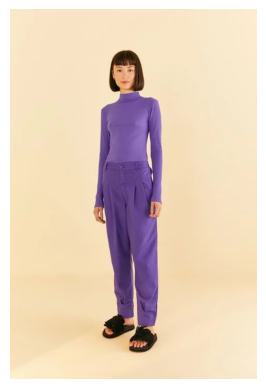

Pink color clothing 0.99
Orange color clothing 0.74
Yellow color clothing 0.50

clothes_images/317431_0700_2-CROPPED-MANGA-LONGA-ADIDAS-ESTAMPADO-SUNNY-DAY-VIVID-RED.jpg


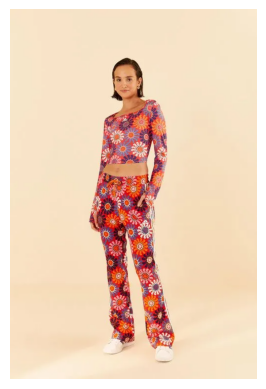

Orange color clothing 0.95
Pink color clothing 0.92
Yellow color clothing 0.85

clothes_images/323253_0013_1-CALCA-BICOLOR-ALFAIATARIA.jpg


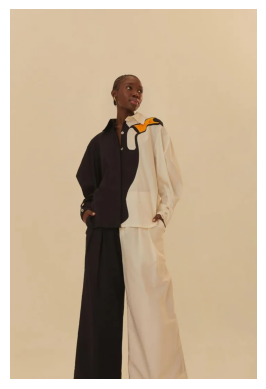

White color clothing 0.85
Brown color clothing 0.63
Black color clothing 0.44

clothes_images/323253_07032_1-CALCA-BICOLOR-ALFAIATARIA.jpg


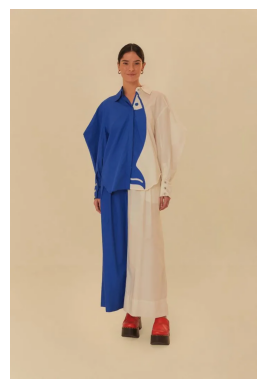

Blue color clothing 0.79
Green color clothing 0.69
White color clothing 0.29

clothes_images/324277_0012_1-CALCA-SARJA-CARGO-COM-CINTO.jpg


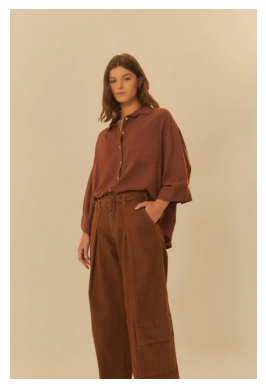

White color clothing 0.86
Brown color clothing 0.61
Yellow color clothing 0.48

clothes_images/324786_0105_2-CALCA-JEANS-AMPLA-PREGAS-BAIXA.jpg


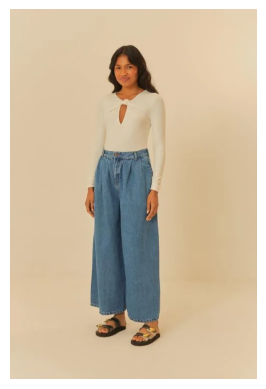

Yellow color clothing 0.93
Orange color clothing 0.78
Pink color clothing 0.54

clothes_images/325155_0700_2-CAMISA-ADIDAS-SOLAR-KALEIDOSCOPE-ROSA.jpg


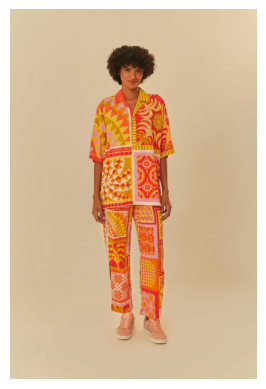

Orange color clothing 0.89
Yellow color clothing 0.88
Pink color clothing 0.83

clothes_images/325496_46188_1-VESTIDO-CROCHET-ESTAMPADO-COBRA-YAWANAWA.jpg


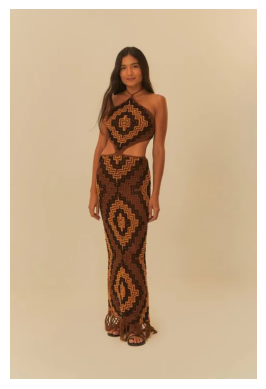

White color clothing 0.72
Yellow color clothing 0.61
Brown color clothing 0.56

clothes_images/325755_46189_2-CALCA-ESTAMPADA-COBRA-MAXI.jpg


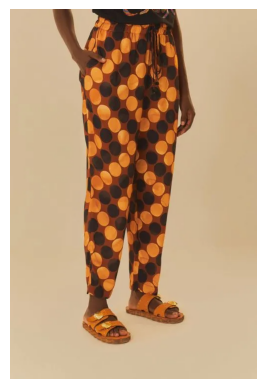

Yellow color clothing 0.97
Orange color clothing 0.94
Pink color clothing 0.73

clothes_images/327287_48291_1-VESTIDO-ESTAMPADO-AURORA-FLORAL.jpg


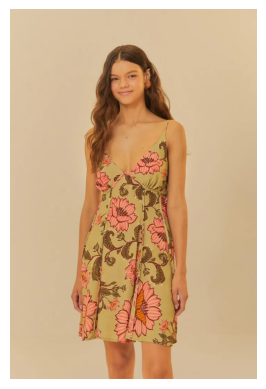

Yellow color clothing 0.94
White color clothing 0.74
Orange color clothing 0.74

clothes_images/327917_0013_1-VESTIDO-BORDADO-AMAZONIA.jpg


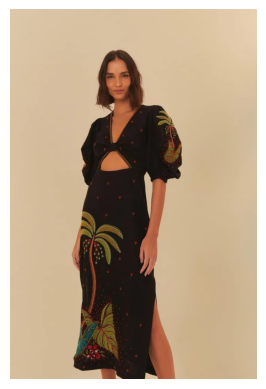

White color clothing 0.83
Brown color clothing 0.61
Yellow color clothing 0.51

clothes_images/327931_07058_1-VESTIDO-OMBRO-SO-ESTAMPADO-FLOR.jpg


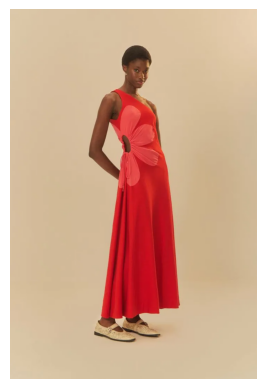

Brown color clothing 0.80
White color clothing 0.68
Black color clothing 0.66

clothes_images/328365_0105_2-SHORT-JEANS-CURVA.jpg


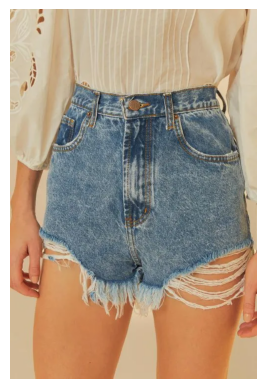

Yellow color clothing 0.86
Orange color clothing 0.69
Pink color clothing 0.51

clothes_images/328372_0142_1-CALCA-JEANS-UTOPIA.jpg


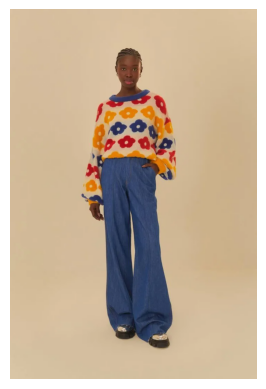

Orange color clothing 0.97
Yellow color clothing 0.95
White color clothing 0.74

clothes_images/329674_48230_2-SWEATER-TRICOT-ESTAMPADO-LISTRA-RAINBOW.jpg


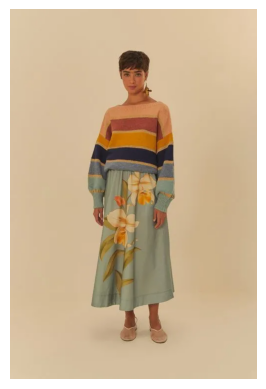

White color clothing 0.93
Yellow color clothing 0.85
Orange color clothing 0.82

clothes_images/329688_07421_1-PULL-TRICOT-ARTESANAL-FLORESv.webp


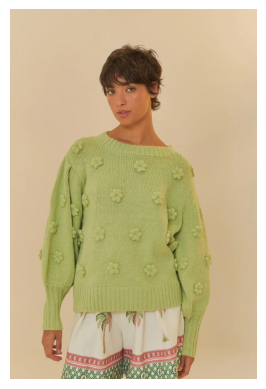

White color clothing 0.83
Orange color clothing 0.73
Yellow color clothing 0.59

clothes_images/329688_8021_1-PULL-TRICOT-ARTESANAL-FLORES.jpg


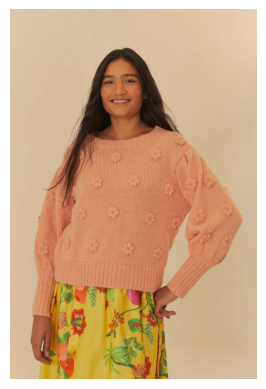

Orange color clothing 0.97
Pink color clothing 0.91
Yellow color clothing 0.79

clothes_images/329689_07423_2-PULL-TRICOT-ARTESANAL-BABADOS.jpg


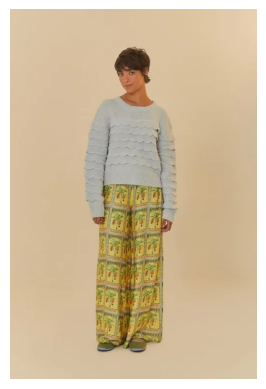

Orange color clothing 0.94
Pink color clothing 0.82
Yellow color clothing 0.76

clothes_images/329757_04530_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


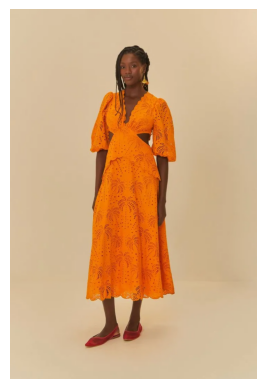

White color clothing 0.98
Yellow color clothing 0.73
Orange color clothing 0.58

clothes_images/329757_05052_1-VESTIDO-LAISE-COQUEIRO-TROPICAL.jpg


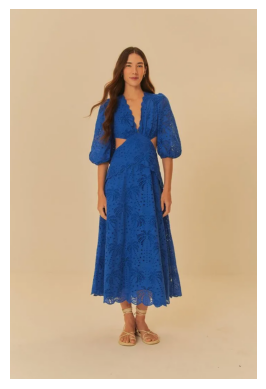

Pink color clothing 0.71
Blue color clothing 0.62
Green color clothing 0.59

clothes_images/329915_48336_2-VESTIDO-ALCA-ESTAMPADO-SEVILHA.jpg


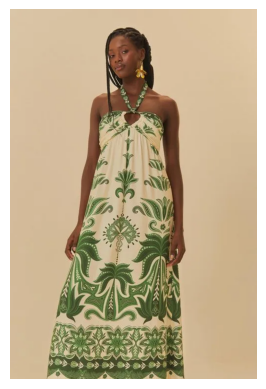

White color clothing 0.79
Blue color clothing 0.35
Brown color clothing 0.33

clothes_images/330027_05079_2-MACACAO-PLISSADO.jpg


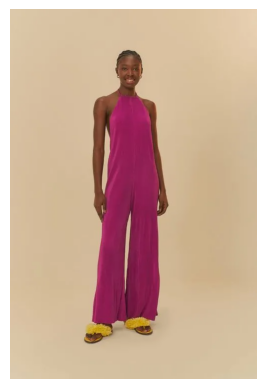

Purple color clothing 0.80
Pink color clothing 0.60
Red color clothing 0.48

clothes_images/330047_07413_1-VESTIDO-REGATA-MARIA.jpg


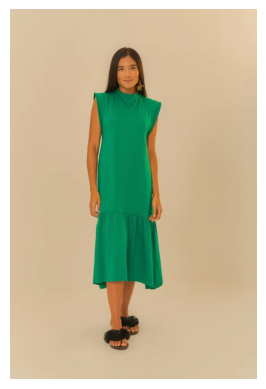

Green color clothing 0.95
Blue color clothing 0.90
Purple color clothing 0.24

clothes_images/330102_02362_1-CAMISA-BOLSO-LONGA.jpg


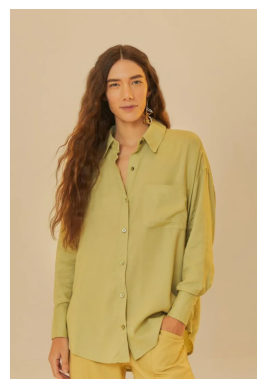

White color clothing 0.91
Brown color clothing 0.32
Yellow color clothing 0.28

clothes_images/330102_05052_1-CAMISA-BOLSO-LONGA.jpg


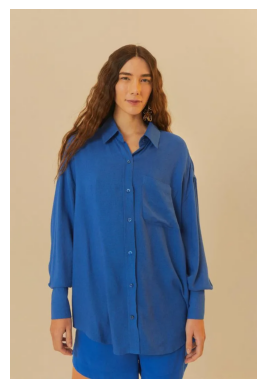

Purple color clothing 0.97
Red color clothing 0.58
Green color clothing 0.38

clothes_images/330102_07415_1-CAMISA-BOLSO-LONGA.jpg


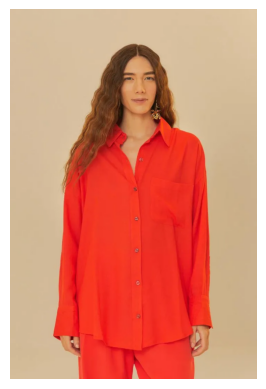

Purple color clothing 0.85
Red color clothing 0.74
Pink color clothing 0.31

clothes_images/330138_0024_2-VESTIDO-LONGO-MARIAS.jpg


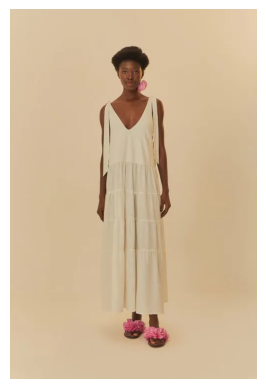

White color clothing 0.90
Brown color clothing 0.59
Yellow color clothing 0.35

clothes_images/330138_05052_2-VESTIDO-LONGO-MARIAS.jpg


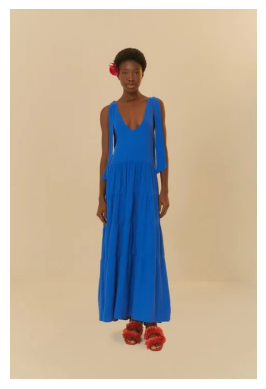

Red color clothing 0.72
Purple color clothing 0.65
Green color clothing 0.59

clothes_images/330139_07412_2-VESTIDO-LONGO-ALCAS.jpg


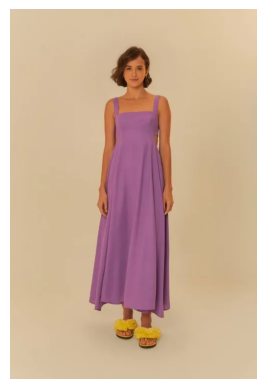

Purple color clothing 0.93
Pink color clothing 0.64
Red color clothing 0.39

clothes_images/330139_07416_1-VESTIDO-LONGO-ALCAS.jpg


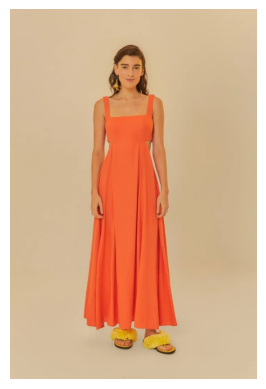

Black color clothing 0.84
Brown color clothing 0.77
Red color clothing 0.56

clothes_images/330148_07412_2-VESTIDO-MANGAS-PREGAS.jpg


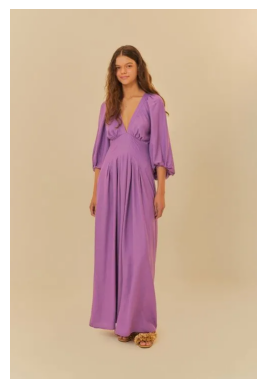

Pink color clothing 0.79
Yellow color clothing 0.74
Orange color clothing 0.73

clothes_images/330149_07414_1-MACACAO-CENOURA-RECORTES.jpg


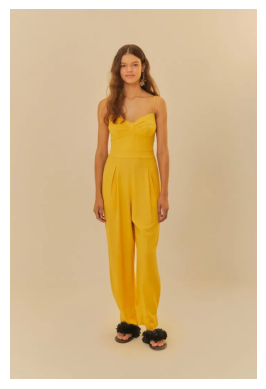

Yellow color clothing 0.98
Orange color clothing 0.85
White color clothing 0.78

clothes_images/330152_07415_1-MACACAO-PREGAS-PANTALONA.jpg


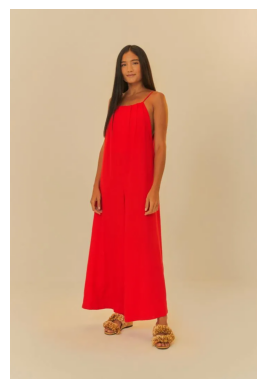

Black color clothing 0.97
Brown color clothing 0.87
Red color clothing 0.77

clothes_images/330154_05079_2-MACACAO-ALCINHAS-PANTALONA.jpg


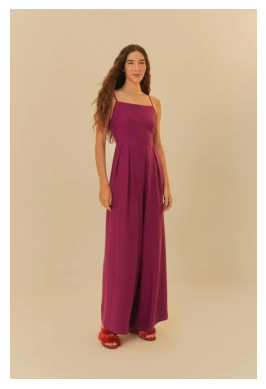

Red color clothing 0.92
Purple color clothing 0.78
Black color clothing 0.37

clothes_images/330156_04530_1-VESTIDO-CURTO-CORSELET.jpg


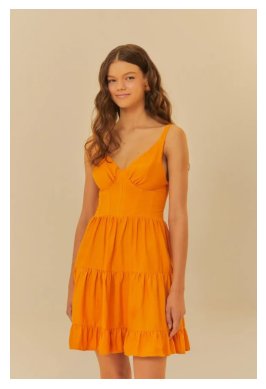

Yellow color clothing 0.98
Orange color clothing 0.83
White color clothing 0.69

clothes_images/330156_07412_1-VESTIDO-CURTO-CORSELET.jpg


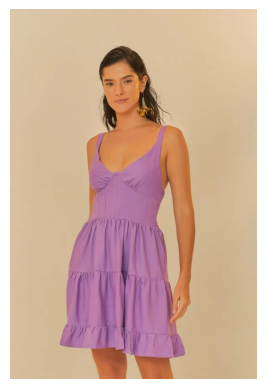

Purple color clothing 0.89
Pink color clothing 0.61
Red color clothing 0.48

clothes_images/330157_05052_1-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


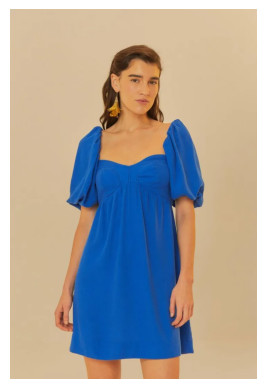

Purple color clothing 0.92
Pink color clothing 0.57
Green color clothing 0.34

clothes_images/330157_07413_1-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


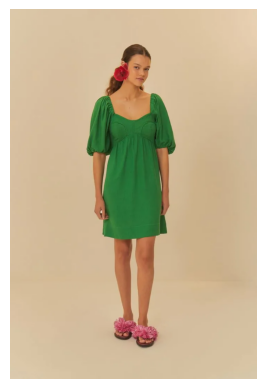

Blue color clothing 0.98
Green color clothing 0.97
Brown color clothing 0.02

clothes_images/330157_07414_2-VESTIDO-CURTO-MANGAS-BUFANTES.jpg


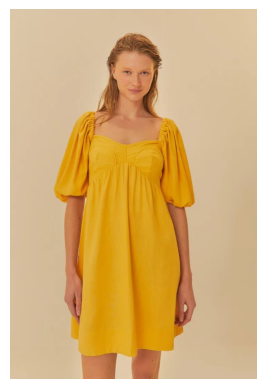

Yellow color clothing 0.94
White color clothing 0.87
Orange color clothing 0.85

clothes_images/330158_07415_1-VESTIDO-CURTO-OMBRO-SO.jpg


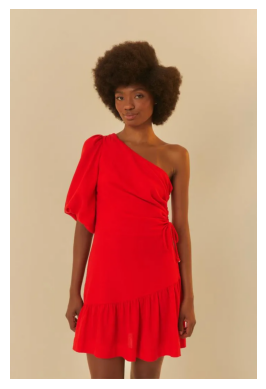

Black color clothing 0.99
Brown color clothing 0.97
Red color clothing 0.59

clothes_images/330163_0013_1-VESTIDO-ALCINHAS-LISTRAS.jpg


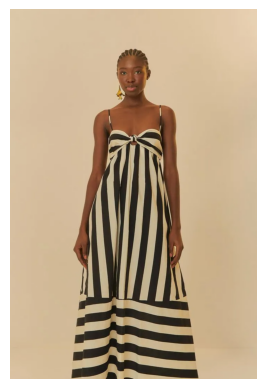

Brown color clothing 0.87
Black color clothing 0.76
White color clothing 0.58

clothes_images/330163_05052_2-VESTIDO-ALCINHAS-LISTRAS.jpg


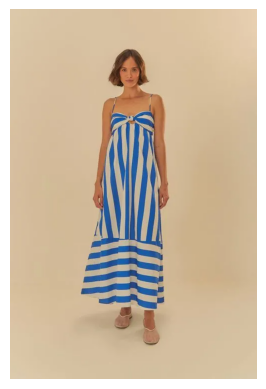

Green color clothing 0.70
Purple color clothing 0.63
Red color clothing 0.61

clothes_images/330169_07413_2-CALCA-RETA-COS-LARGO.jpg


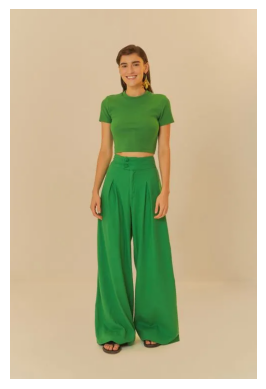

Pink color clothing 0.93
Orange color clothing 0.64
Purple color clothing 0.34

clothes_images/330169_07415_2-CALCA-RETA-COS-LARGO.jpg


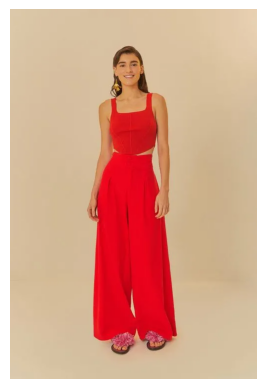

Red color clothing 0.87
Black color clothing 0.63
Purple color clothing 0.43

clothes_images/330173_0013_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


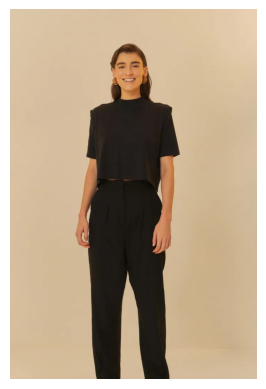

Brown color clothing 0.93
Black color clothing 0.87
White color clothing 0.41

clothes_images/330173_0024_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


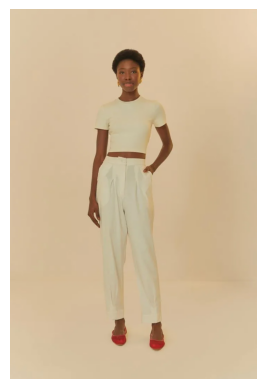

White color clothing 0.96
Yellow color clothing 0.53
Brown color clothing 0.44

clothes_images/330173_07416_1-CALCA-CENOURA-DETALHE-FRENTE.jpg


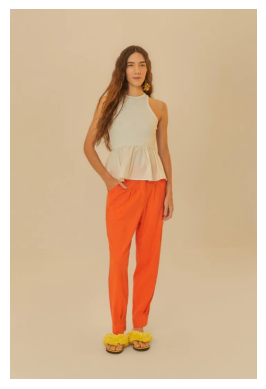

Yellow color clothing 0.97
Orange color clothing 0.83
White color clothing 0.57

clothes_images/330200_05052_2-BLAZER-BOLSO-LONGO.jpg


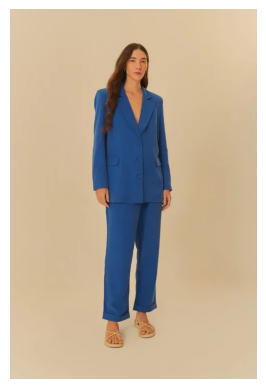

Purple color clothing 0.96
Pink color clothing 0.58
Red color clothing 0.45

clothes_images/330362_48218_2-MACACAO-ESTAMPADO-BANANARTE.jpg


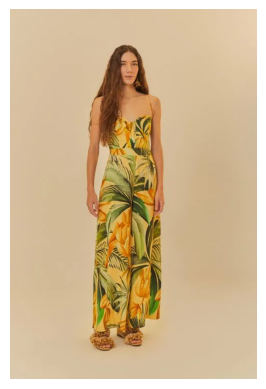

White color clothing 0.81
Yellow color clothing 0.77
Orange color clothing 0.49

clothes_images/330451_48302_2-VESTIDO-CROPPED-ESTAMPADO-DUDA.jpg


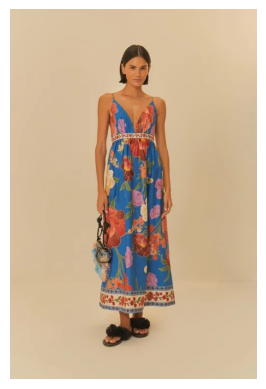

Purple color clothing 0.72
Red color clothing 0.53
Pink color clothing 0.51

clothes_images/331705_0101_1-JAQUETA-JEANS-CROPPED.jpg


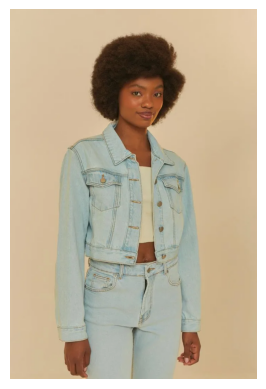

Yellow color clothing 0.98
Orange color clothing 0.96
White color clothing 0.74

clothes_images/331714_0142_2-CALCA-JEANS-WIDE-RECORTE.jpg


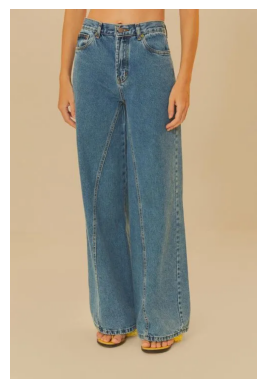

Pink color clothing 0.78
Yellow color clothing 0.75
Orange color clothing 0.73

clothes_images/331733_0142_2-SAIA-JEANS-MIDI-GODE.jpg


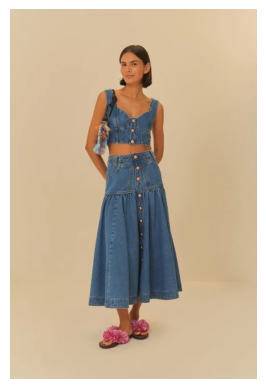

White color clothing 0.62
Blue color clothing 0.60
Green color clothing 0.47

clothes_images/332043_48315_2-VESTIDO-CURTO-ESTAMPADO-MILANI-COQUEIROS.jpg


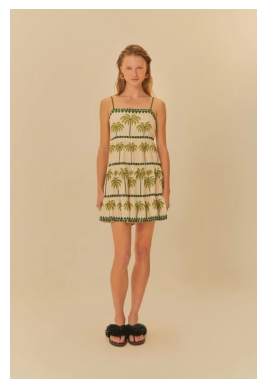

White color clothing 0.86
Brown color clothing 0.60
Black color clothing 0.35

clothes_images/332046_48295_1-CALCA-PANTALONA-ESTAMPADA-HELOISA.jpg


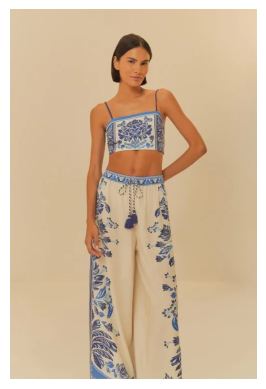

Pink color clothing 0.90
Orange color clothing 0.73
Yellow color clothing 0.42

clothes_images/332928_48288_2-SAIA-MOLETOM-ESTAMPADA-SONHO-DOS-PASSAROS.jpg


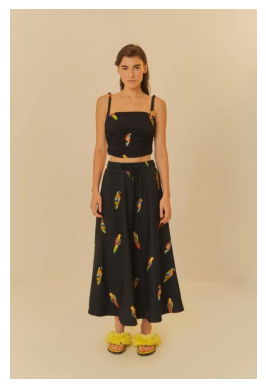

White color clothing 0.74
Brown color clothing 0.60
Yellow color clothing 0.57

clothes_images/332972_48323_2-VESTIDO-CROPPED-ESTAMPADO-CHITA-BELLA-FLOR.jpg


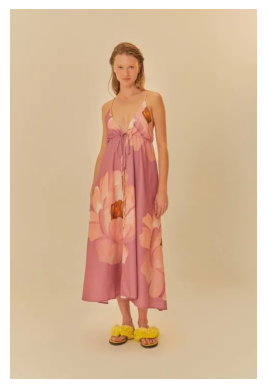

Yellow color clothing 0.94
Orange color clothing 0.75
White color clothing 0.54

clothes_images/333108_48983_1-VESTIDO-CURTO-ESTAMPADO-FLORAL-ERIKA.jpg


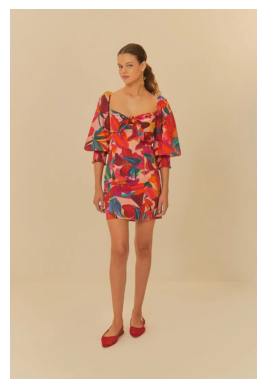

Pink color clothing 0.99
Orange color clothing 0.90
Yellow color clothing 0.70

clothes_images/333122_48978_2-CALCA-TAMBAQUI-DECORADO.jpg


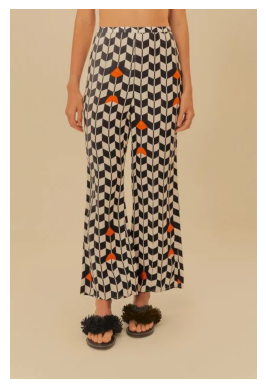

Yellow color clothing 0.94
Orange color clothing 0.75
White color clothing 0.51

clothes_images/334370_07415_2-REGATA-BASICA-QUADRADA.jpg


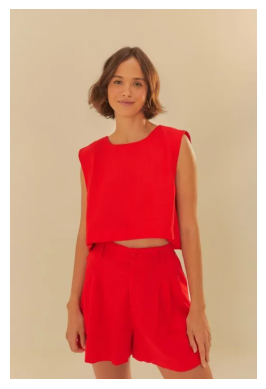

Brown color clothing 0.59
Black color clothing 0.58
Yellow color clothing 0.53

clothes_images/334828_48302_2-MACAQUINHO-ESTAMPADO-DUDA.jpg


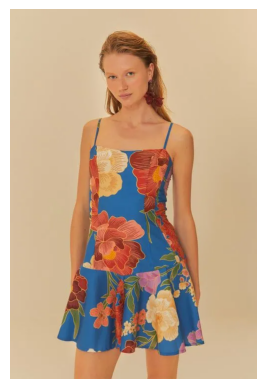

Red color clothing 0.91
Purple color clothing 0.69
Black color clothing 0.55

clothes_images/335138_0013_2-SAIA-AMPLA-BOLSO.jpg


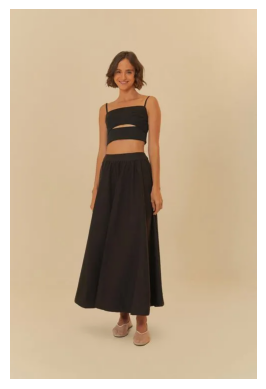

Brown color clothing 0.94
Black color clothing 0.85
White color clothing 0.45

clothes_images/338842_49083_2-TOP-PAPILLON.jpg


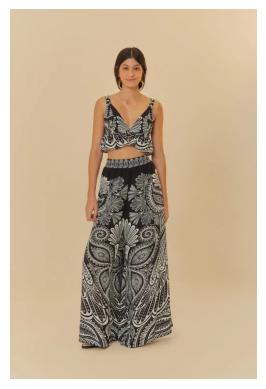

White color clothing 0.82
Brown color clothing 0.62
Black color clothing 0.36

clothes_images/339080_05052_2-CALCA-FAIXA-CLOCHARD.jpg


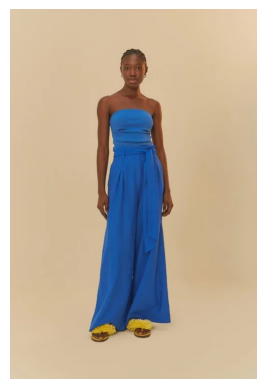

Black color clothing 0.81
Brown color clothing 0.78
Red color clothing 0.56



In [233]:
# Aplicando o mesmo PCA nos embs das imagens
img_embeddings_pca = pca.transform(img_embs)

# para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
for i in range(img_embeddings_pca.shape[1]):
  min_value_color = cores_embeddings_pca[:, i].min()
  max_value_color = cores_embeddings_pca[:, i].max()
  min_value_img = img_embeddings_pca[:, i].min()
  max_value_img = img_embeddings_pca[:, i].max()
  img_embeddings_pca[:, i] = (img_embeddings_pca[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


cos_sim = util.cos_sim(img_embeddings_pca, cores_embeddings_pca)

# para cada imagem, vendo a semelhança com cada cor
for file_name, scores in zip(df['image_path'].values, cos_sim):
  print(file_name)
  plot_image(file_name)
  # top 3 colors:
  scores = scores.numpy()
  top_3_indices = scores.argsort()
  for i in range(3):
    print(df_color.iloc[top_3_indices[-i-1]]['color_name'], f"{scores[top_3_indices[-i-1]]:.2f}")
  print()

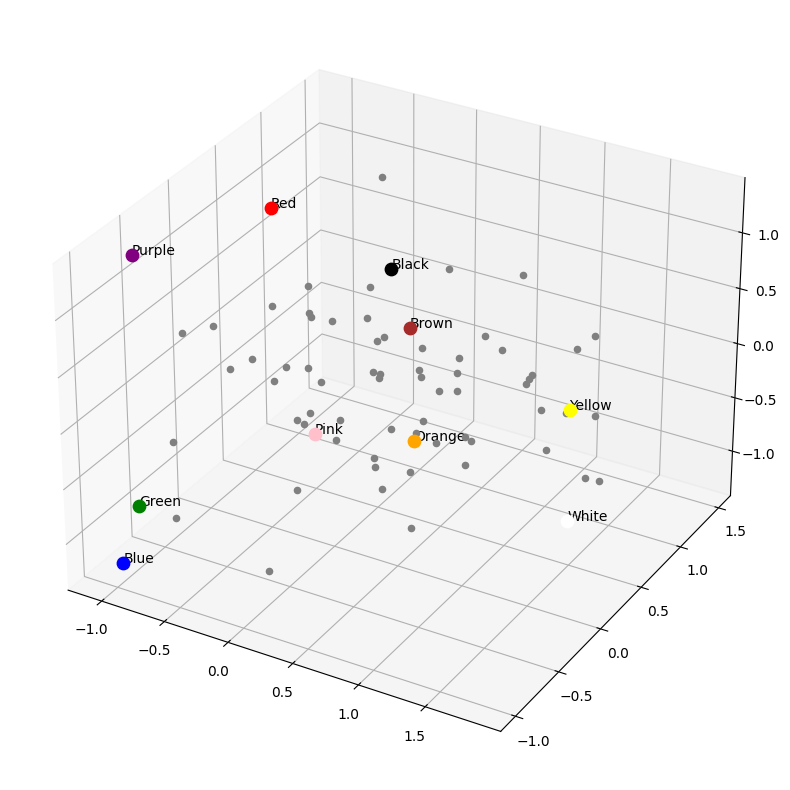

In [235]:
# para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
for i in range(img_embeddings_pca.shape[1]):
  min_value_color = cores_embeddings_pca[:, i].min()
  max_value_color = cores_embeddings_pca[:, i].max()
  min_value_img = img_embeddings_pca[:, i].min()
  max_value_img = img_embeddings_pca[:, i].max()
  img_embeddings_pca[:, i] = (img_embeddings_pca[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color

cos_sim = util.cos_sim(img_embeddings_pca, cores_embeddings_pca)

# Plot 3d com as dimensões do PCA(X a dimensão 0, Y a dimensão 1, Z a dimensão 2) -usando as três primeiras dimensões de cores_embeddings_pca

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Plotando alguns exemplos de imagens nesse plot de cores
sample = img_embeddings_pca

for i, (x, y, z) in enumerate(sample[:, :3]):
    ax.scatter(x, y, z, color='gray')

for i, (x, y, z) in enumerate(cores_embeddings_pca[:, :3]):
    color = df_color.iloc[i]['color_name'].replace(" color clothing", "").replace("Roupa da cor ", "")
    # plotting colored according to the color value
    ax.scatter(x, y, z, color=color, s=80)
    ax.text(x, y, z, color)

    


In [240]:
df_color

,image_path,color_name
0,colored_dresses_images/Black color clothing.png,Black color clothing
1,colored_dresses_images/Blue color clothing.png,Blue color clothing
2,colored_dresses_images/Brown color clothing.png,Brown color clothing
3,colored_dresses_images/Green color clothing.png,Green color clothing
4,colored_dresses_images/Orange color clothing.png,Orange color clothing
5,colored_dresses_images/Pink color clothing.png,Pink color clothing
6,colored_dresses_images/Purple color clothing.png,Purple color clothing
7,colored_dresses_images/Red color clothing.png,Red color clothing
8,colored_dresses_images/White color clothing.png,White color clothing
9,colored_dresses_images/Yellow color clothing.png,Yellow color clothing


In [243]:
df

,image_path,file_name,id,desc_produto,pca_0,pca_1
0,clothes_images/313278_02851_2-BLUSA-GOLA-MANGA...,313278_02851_2-BLUSA-GOLA-MANGAS,313278_02851,Blusa gola mangas,-0.083733,-2.192070
1,clothes_images/317431_0700_2-CROPPED-MANGA-LON...,317431_0700_2-CROPPED-MANGA-LONGA-ADIDAS-ESTAM...,317431_0700,Cropped manga longa adidas estampado sunny day...,-1.594988,-1.139551
2,clothes_images/323253_0013_1-CALCA-BICOLOR-ALF...,323253_0013_1-CALCA-BICOLOR-ALFAIATARIA,323253_0013,Calca bicolor alfaiataria,2.279298,0.732525
3,clothes_images/323253_07032_1-CALCA-BICOLOR-AL...,323253_07032_1-CALCA-BICOLOR-ALFAIATARIA,323253_07032,Calca bicolor alfaiataria,2.193538,-1.107572
4,clothes_images/324277_0012_1-CALCA-SARJA-CARGO...,324277_0012_1-CALCA-SARJA-CARGO-COM-CINTO,324277_0012,Calca sarja cargo com cinto,0.094160,0.497270
...,...,...,...,...,...,...
59,clothes_images/334370_07415_2-REGATA-BASICA-QU...,334370_07415_2-REGATA-BASICA-QUADRADA,334370_07415,Regata basica quadrada,-1.959663,0.121041
60,clothes_images/334828_48302_2-MACAQUINHO-ESTAM...,334828_48302_2-MACAQUINHO-ESTAMPADO-DUDA,334828_48302,Macaquinho estampado duda,0.433913,0.510343
61,clothes_images/335138_0013_2-SAIA-AMPLA-BOLSO.jpg,335138_0013_2-SAIA-AMPLA-BOLSO,335138_0013,Saia ampla bolso,1.192019,-0.584239
62,clothes_images/338842_49083_2-TOP-PAPILLON.jpg,338842_49083_2-TOP-PAPILLON,338842_49083,Top papillon,2.401128,-1.296179


In [248]:
import plotly.graph_objs as go

# Plotly figure
fig = go.Figure()

# Adding gray image points with hover to show the actual image
for i in range(img_embeddings_pca.shape[0]):
    img_description = df.iloc[i]['desc_produto']
    fig.add_trace(go.Scatter3d(
        x=[img_embeddings_pca[i, 0]],
        y=[img_embeddings_pca[i, 1]],
        z=[img_embeddings_pca[i, 2]],
        mode='markers',
        marker=dict(size=5, color='gray'),
        name=f'Image {i}',
        text=img_description,
        hoverinfo='text'
    ))

# Adding color points
for i in range(cores_embeddings_pca.shape[0]):
    color = df_color.iloc[i]['color_name'].replace(" color clothing", "").replace("Roupa da cor ", "").lower().strip()
    fig.add_trace(go.Scatter3d(
        x=[cores_embeddings_pca[i, 0]],
        y=[cores_embeddings_pca[i, 1]],
        z=[cores_embeddings_pca[i, 2]],
        mode='markers+text',
        marker=dict(size=8, color=color),
        name=f'Color {color}',
        text=color,
        hoverinfo='text'
    ))

# Update layout for better visualization
fig.update_layout(
    title="3D PCA Embeddings of Images and Colors",
    scene=dict(
        xaxis_title="PCA Dimension 1",
        yaxis_title="PCA Dimension 2",
        zaxis_title="PCA Dimension 3"
    ),
    showlegend=False
)

# Show the plot
fig.show()


Insights:

- Mesmo com a padronização, as cores ainda estão muito próximas no espaço. É desejável transformar o espaço das cores base para distribuí-las mais uniformemente. (tarefa não trivial)

- Uma alternativa, como mencionado anteriormente, seria realizar um finetunning com as imagens das roupas coloridas para seja possível compreender melhor as cores e clusterizar os produtos (tarefa não trivial)

## 2° Abordagem: PLS-DA

(A ser desenvolvido, precisamos de uma target de cor para cada produto).

## Teste adicional: recortando roupa da análise

Outro problema que irá surgir é quando queremos analisar uma peça de roupa específica e a foto contém mais de uma peça. Nesse caso, o modelo não poderia identificar a cor da peça que queremos analisar independentemente.
Devido a complexidade de identificar no subespaço a cor referente a uma das peças, uma alternativa viável é recortar apenas a peça principal para a análise de cor. O recorte pode ser feito utilizando o (bound box + epsilon) do modelo de reconhecimento que havíamos testado anteriormente.